# Estimating Hospitalization Risk

In [59]:
import pandas as pd 
import numpy as np
from scipy.signal import correlate, correlation_lags
from datetime import datetime
import seaborn as sns
import requests
from pprint import pprint
import copy
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.dates as mdates
fmt = mdates.DateFormatter('%d-%b\n%Y')  
import matplotlib.pyplot as plt
import warnings
from translate import Translator
warnings.filterwarnings("ignore")

## Getting the data from FOPH
The URLs for downloading the data can be updated daily so that we can download the lates data.

In [2]:
all_cantons = ['AG', 'AI', 'AR', 'BE', 'BL', 'BS', 'FL', 'FR', 'GE', 'GL', 'GR', 'JU',
       'LU', 'NE', 'NW', 'OW', 'SG', 'SH', 'SO', 'SZ', 'TG', 'TI', 'UR', 'VD',
       'VS', 'ZG', 'ZH']

In [3]:
context_url = "https://www.covid19.admin.ch/api/data/context"
context = requests.get(context_url).json()
pprint(context['sources']['individual']['csv']['daily'])

{'cases': 'https://www.covid19.admin.ch/api/data/20220106-ac2j7vry/sources/COVID19Cases_geoRegion.csv',
 'casesVaccPersons': 'https://www.covid19.admin.ch/api/data/20220106-ac2j7vry/sources/COVID19Cases_vaccpersons.csv',
 'covidCertificates': 'https://www.covid19.admin.ch/api/data/20220106-ac2j7vry/sources/COVID19Certificates.csv',
 'death': 'https://www.covid19.admin.ch/api/data/20220106-ac2j7vry/sources/COVID19Death_geoRegion.csv',
 'deathVaccPersons': 'https://www.covid19.admin.ch/api/data/20220106-ac2j7vry/sources/COVID19Death_vaccpersons.csv',
 'hosp': 'https://www.covid19.admin.ch/api/data/20220106-ac2j7vry/sources/COVID19Hosp_geoRegion.csv',
 'hospCapacity': 'https://www.covid19.admin.ch/api/data/20220106-ac2j7vry/sources/COVID19HospCapacity_geoRegion.csv',
 'hospVaccPersons': 'https://www.covid19.admin.ch/api/data/20220106-ac2j7vry/sources/COVID19Hosp_vaccpersons.csv',
 'intCases': 'https://www.covid19.admin.ch/api/data/20220106-ac2j7vry/sources/COVID19IntCases.csv',
 're': 'ht

### Updated HUG hospitalizations

In [4]:
def get_updated_data(fname='hug_covid_db_daily_newdb_20211213_clean.xlsx', smooth=True):
    '''Fetch Hospitalization numbers reported by HUG'''
    if fname.endswith('xlsx'):
        df = pd.read_excel(fname)
    elif fname.endswith('csv'):
        df = pd.read_csv(fname)
    df.index = pd.to_datetime(df.Date_Entry)
    df.columns = [c.strip() for c in df.columns]
    #df = df.loc[:'2021-12-09']
    df_hosp = df.resample('D').count()
#     print(df_hosp.columns)
    if smooth:
        df_hosp  = df_hosp['ID'].rolling(7,closed='both').mean()
        df_hosp = df_hosp.dropna()
    else:
        df_hosp = df_hosp['ID']
    df_hosp = df_hosp.sort_index()
    df_hosp.columns=['hosp_GE']
    return df_hosp['2021-09-15':]

Date_Entry
2021-12-26    16
Freq: D, Name: ID, dtype: int64


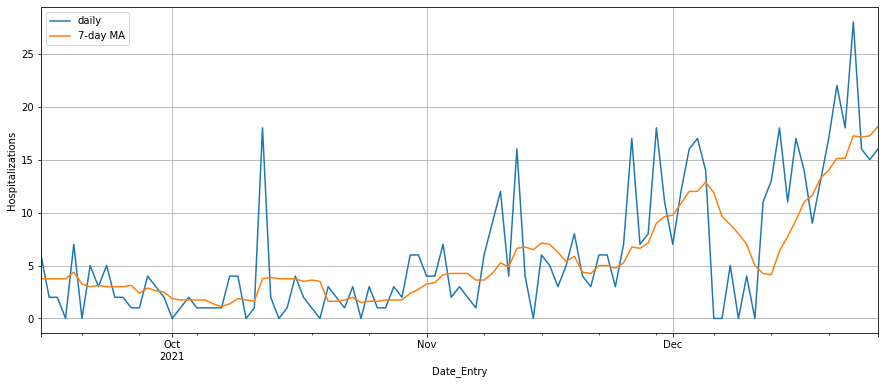

In [5]:
hug = get_updated_data('Data_COV_w51_clean.csv',smooth=False)
print(hug.tail(1))
hosp_hug = get_updated_data('Data_COV_w51_clean.csv',smooth=True)
ax = hug.plot(label='daily')
hosp_hug.plot(ax=ax, figsize=(15,6),label='7-day MA');
plt.grid();
plt.legend(['daily', '7-day MA'])
plt.ylabel("Hospitalizations")
plt.savefig('HUG_hosp.png', dpi=200)

In [6]:
def get_cluster_data(curve, georegion):
    
    '''
    This function provide a dataframe with the curve selected in the param curve for each region selected in the 
    param georegion
    
    param curve: string. The following options are accepted: ['cases', 'death',
                                                              'hosp', 'hospCapacity', 
                                                              're', 'test', 'testPcrAntigen', 'virusVariantsWgs']
    param georegion: array with all the geoRegions of interest.
    
    return dataframe
    '''

    
    context_url = "https://www.covid19.admin.ch/api/data/context"
    context = requests.get(context_url).json()
    
    
    if (curve=='hospCapacity'):
        df = pd.read_csv(context['sources']['individual']['csv']['daily'][curve],
                     usecols=['geoRegion','date','ICU_Covid19Patients'])
        df.index = pd.to_datetime(df.date)
        
    else: 
        df = pd.read_csv(context['sources']['individual']['csv']['daily'][curve],
                     usecols=['geoRegion','datum','entries'])
        df.index = pd.to_datetime(df.datum)
    
    # dataframe where will the curve for each region
    
    df_end = pd.DataFrame()
    
    for i in georegion:

        if curve == 'hospCapacity':
            df_end['ICU_patients_'+i] = df.loc[df.geoRegion == i].ICU_Covid19Patients
        else:
            df_end[curve+'_'+i] = df.loc[df.geoRegion == i].entries
    df_end = df_end.resample('D').mean()   
    return df_end

def get_combined_data( data_types, georegion,vaccine = True, smooth = True):
    
    '''
    This function provide a dataframe with the all the curves selected in the param data_types for each region selected in the 
    param georegion
    
    param data_types: array. The following options are accepted: ['cases', 'casesVaccPersons', 'covidCertificates', 'death',
                                                             'deathVaccPersons', 'hosp', 'hospCapacity', 'hospVaccPersons',
                                                             'intCases', 're', 'test', 'testPcrAntigen', 'virusVariantsWgs']
    param georegion: array with all the geoRegions of interest.
    
    return dataframe
    '''

    for i in np.arange(0, len(data_types)):
        
        if i == 0:
            
            df = get_cluster_data(data_types[i], georegion)
            
        else:
            
            df = df.merge(get_cluster_data(data_types[i], georegion), left_index =True, right_index = True)
    
    
    if vaccine == True:
        ## adicionando os dados de vacinação para a suiça disponibilizados pelo 
        ## Our World in Data
        vac = pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv')
        
        # selecionando apenas os dados da suiça 
        vac = vac.loc[vac.iso_code == 'CHE']
        vac.index = pd.to_datetime(vac.date)
        
        vac = vac[['total_vaccinations_per_hundred']]
        
        vac = vac.fillna(0)
        
        if vac.total_vaccinations_per_hundred[-1] == 0:
            vac.total_vaccinations_per_hundred[-1] = vac.total_vaccinations_per_hundred[-2]
    
        
        df['vac_all'] = vac.total_vaccinations_per_hundred
        
    
    # filling the NaN values by zero 
    df = df.fillna(0)
    
    if smooth == True:
        df = df.rolling(window = 7).mean()
        
        df = df.dropna()

        
    return df 

# get_combined_data(['hospCapacity','hosp'], georegion=all_cantons)

### Daily Hospitalizations by region

In [7]:
hurl = context['sources']['individual']['csv']['daily']['hosp']
print(f"Downloading from: {hurl}")
Hosp = pd.read_csv(hurl,usecols=['geoRegion','datum','entries'])
Hosp.tail(10)

,geoRegion,datum,entries
19797,ZH,2021-12-28,19
19798,ZH,2021-12-29,14
19799,ZH,2021-12-30,7
19800,ZH,2021-12-31,5
19801,ZH,2022-01-01,15
19802,ZH,2022-01-02,7
19803,ZH,2022-01-03,14
19804,ZH,2022-01-04,4
19805,ZH,2022-01-05,0
19806,ZH,2022-01-06,0


In [8]:
Hosp['date'] = pd.to_datetime(Hosp.datum)
Hosp.set_index('date', inplace=True)

### Daily Cases by region

In [9]:
curl = context['sources']['individual']['csv']['daily']['cases']
print(f"Downloading from: {curl}")
Cases = pd.read_csv(curl, usecols=['geoRegion','datum','entries'])
Cases[Cases.geoRegion=='ZH']

,geoRegion,datum,entries
19124,ZH,2020-02-24,0
19125,ZH,2020-02-25,0
19126,ZH,2020-02-26,1
19127,ZH,2020-02-27,1
19128,ZH,2020-02-28,0
...,...,...,...
19802,ZH,2022-01-02,2171
19803,ZH,2022-01-03,4615
19804,ZH,2022-01-04,4491
19805,ZH,2022-01-05,1913


In [10]:
Cases['date'] = pd.to_datetime(Cases.datum)
Cases.set_index('date', inplace=True)

### Daily Hospitalizations of vaccinated persons

In [11]:
hvpurl = context['sources']['individual']['csv']['daily']['hospVaccPersons']
print(f"Downloading from: {hvpurl}")
Hosp_vp = pd.read_csv(hvpurl,usecols=['geoRegion','date','entries'])
Hosp_vp

,date,entries,geoRegion
0,2021-01-27,0,CHFL
1,2021-01-28,0,CHFL
2,2021-01-29,0,CHFL
3,2021-01-30,0,CHFL
4,2021-01-31,0,CHFL
...,...,...,...
3435,2022-01-04,11,CHFL
3436,2022-01-05,8,CHFL
3437,2022-01-05,0,CHFL
3438,2022-01-05,3,CHFL


In [12]:
Hosp_vp['date'] = pd.to_datetime(Hosp_vp.date)
Hosp_vp.set_index('date', inplace=True)

### Tests

In [13]:
testurl = context['sources']['individual']['csv']['daily']['test']
print(f"Downloading from: {testurl}")
Tests = pd.read_csv(testurl, low_memory=False, usecols=['geoRegion','datum','entries', 'entries_pos'])
Tests = Tests.convert_dtypes()
Tests

,datum,entries,entries_pos,geoRegion
0,2020-02-06,1,0,CHFL
1,2020-02-12,1,0,CHFL
2,2020-02-24,33,1,CHFL
3,2020-02-25,159,0,CHFL
4,2020-02-26,317,8,CHFL
...,...,...,...,...
19804,2022-01-01,5171,1861,ZH
19805,2022-01-02,4743,1831,ZH
19806,2022-01-03,9763,3819,ZH
19807,2022-01-04,14522,5635,ZH


In [14]:
Tests['date'] = pd.to_datetime(Tests.datum)
Tests.set_index('date', inplace=True)

### Deaths

In [15]:
durl = context['sources']['individual']['csv']['daily']['death']
print(f"Downloading from: {durl}")
Death = pd.read_csv(durl, usecols=['geoRegion','datum','entries'])
Death

,geoRegion,datum,entries
0,CH,2020-02-24,0
1,CH,2020-02-25,0
2,CH,2020-02-26,0
3,CH,2020-02-27,0
4,CH,2020-02-28,0
...,...,...,...
19802,ZH,2022-01-02,2
19803,ZH,2022-01-03,0
19804,ZH,2022-01-04,2
19805,ZH,2022-01-05,0


In [16]:
Death['date'] = pd.to_datetime(Death.datum)
Death.set_index('date', inplace=True)

### $R_e$

In [17]:
reurl = context['sources']['individual']['csv']['daily']['re']
print(f"Downloading from: {reurl}")
Re = pd.read_csv(reurl)
Re.dropna().tail(10)

,geoRegion,date,median_R_mean,median_R_highHPD,median_R_lowHPD,timeframe_14d,timeframe_28d,timeframe_phase2,timeframe_phase2b,timeframe_phase3,timeframe_phase4,timeframe_phase5,timeframe_all,type,version,median_R_mean_mean7d
19517,ZH,2021-12-11,0.97,1.04,0.90,False,True,True,True,True,True,True,True,COVID19Re,2022-01-06_08-06-39,0.95
19518,ZH,2021-12-12,1.01,1.08,0.93,False,True,True,True,True,True,True,True,COVID19Re,2022-01-06_08-06-39,0.95
19519,ZH,2021-12-13,1.04,1.12,0.96,False,True,True,True,True,True,True,True,COVID19Re,2022-01-06_08-06-39,0.97
19520,ZH,2021-12-14,1.08,1.16,1.00,False,True,True,True,True,True,True,True,COVID19Re,2022-01-06_08-06-39,0.99
19521,ZH,2021-12-15,1.12,1.20,1.05,False,True,True,True,True,True,True,True,COVID19Re,2022-01-06_08-06-39,1.01
19522,ZH,2021-12-16,1.16,1.24,1.09,False,True,True,True,True,True,True,True,COVID19Re,2022-01-06_08-06-39,1.05
19523,ZH,2021-12-17,1.21,1.31,1.11,False,True,True,True,True,True,True,True,COVID19Re,2022-01-06_08-06-39,1.08
19524,ZH,2021-12-18,1.25,1.38,1.11,False,True,True,True,True,True,True,True,COVID19Re,2022-01-06_08-06-39,1.12
19525,ZH,2021-12-19,1.27,1.45,1.10,False,True,True,True,True,True,True,True,COVID19Re,2022-01-06_08-06-39,1.16
19526,ZH,2021-12-20,1.28,1.47,1.09,False,True,True,True,True,True,True,True,COVID19Re,2022-01-06_08-06-39,1.20


In [18]:
Re['date'] = pd.to_datetime(Re.date)
Re.set_index('date', inplace=True)

## Getting Austrian data
The Austrian timeseries can be downloaded from here: [Austrian data](https://info.gesundheitsministerium.gv.at/data/timeline-faelle-bundeslaender.csv)

In [19]:
import requests
import urllib3
import io
requests.packages.urllib3.util.ssl_.DEFAULT_CIPHERS = 'ALL:@SECLEVEL=1'

url='https://info.gesundheitsministerium.gv.at/data/timeline-faelle-bundeslaender.csv'
res = requests.get(url)
austria = pd.read_csv(io.BytesIO(res.content), sep=';')

In [20]:
# cols = [Translator(to_lang='en-us', provider='mymemory', from_lang='de').translate(c).replace(" ","_") for c in austria.columns]
# austria.columns = cols
austria['date'] = pd.to_datetime(austria.Datum)
austria.set_index('date', inplace=True)
austria

,Datum,BundeslandID,Name,BestaetigteFaelleBundeslaender,Todesfaelle,Genesen,Hospitalisierung,Intensivstation,Testungen,TestungenPCR,TestungenAntigen
date,,,,,,,,,,,
2021-03-01 09:30:00+01:00,2021-03-01T09:30:00+01:00,1,Burgenland,12657,239,11701,43,10,638575,155435,483140
2021-03-01 09:30:00+01:00,2021-03-01T09:30:00+01:00,2,Kärnten,29225,683,27316,96,15,675557,217933,457624
2021-03-01 09:30:00+01:00,2021-03-01T09:30:00+01:00,3,Niederösterreich,74538,1350,67900,349,82,3400756,1141984,2258772
2021-03-01 09:30:00+01:00,2021-03-01T09:30:00+01:00,4,Oberösterreich,86409,1515,82567,120,20,2162517,546777,1615740
2021-03-01 09:30:00+01:00,2021-03-01T09:30:00+01:00,5,Salzburg,37327,493,35318,71,15,823353,274598,548755
...,...,...,...,...,...,...,...,...,...,...,...
2022-01-07 09:30:00+01:00,2022-01-07T09:30:00+01:00,6,Steiermark,155525,2500,148207,101,22,16681736,3032397,13649339
2022-01-07 09:30:00+01:00,2022-01-07T09:30:00+01:00,7,Tirol,128241,813,119008,117,39,7442812,1968698,5474114
2022-01-07 09:30:00+01:00,2022-01-07T09:30:00+01:00,8,Vorarlberg,65268,431,61964,36,12,5846299,652412,5193887


In [21]:
Cases_au = austria[austria.BundeslandID==9].BestaetigteFaelleBundeslaender.diff()
fig = px.line(x=Cases_au.index, y=Cases_au)
fig.update_layout(yaxis_title='Confirmed cases', xaxis_title='Time (days)', title='Confirmed cases in Vienna')
fig

## Visualizing the Series

### Hospitalizations

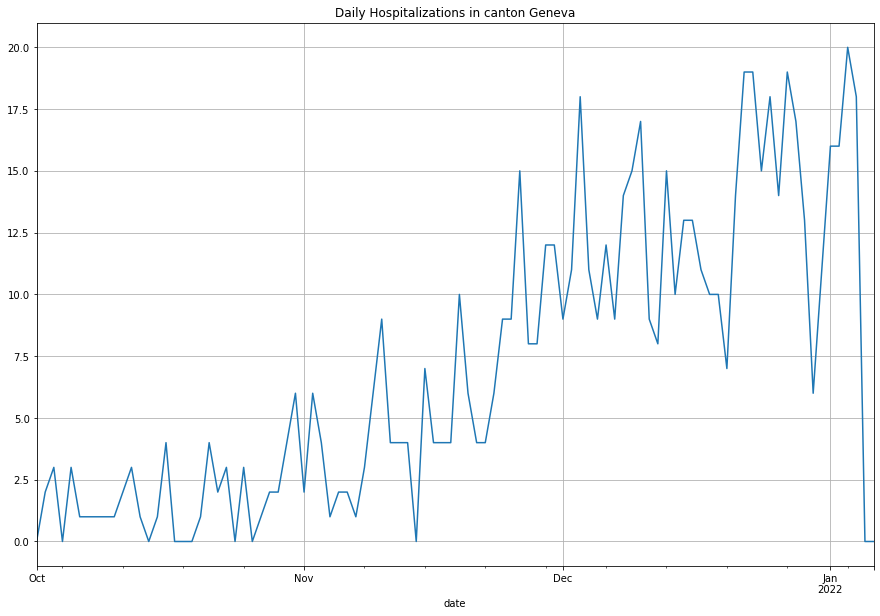

In [22]:
Hosp[Hosp.geoRegion=='GE'].loc['2021-10-01':].entries.plot(figsize=(15,10), grid=True);
plt.title('Daily Hospitalizations in canton Geneva');
plt.savefig('hospitalizations.png', dpi=300)

### Cases

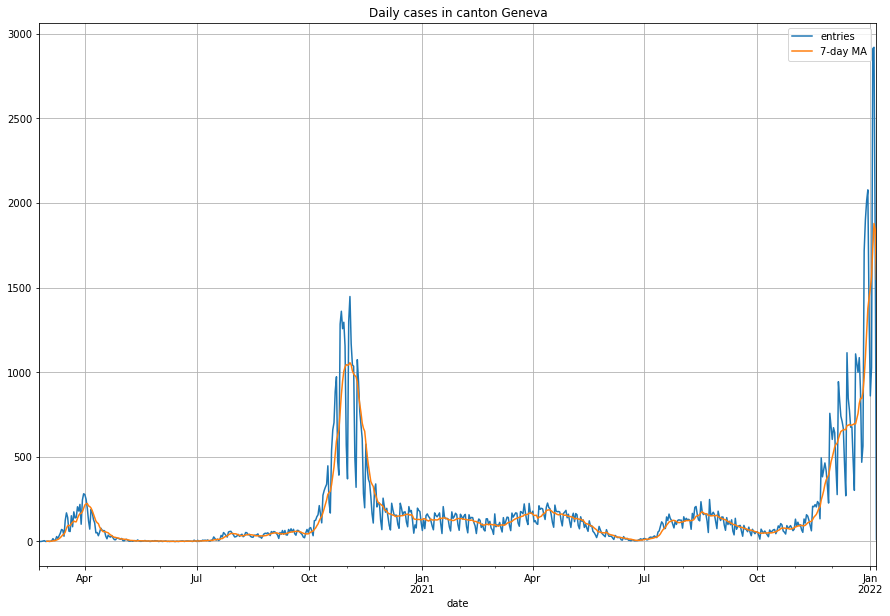

In [23]:
Cases[Cases.geoRegion=='GE'].entries.plot(figsize=(15,10), grid=True);
Cases[Cases.geoRegion=='GE'].entries.rolling(7).mean().plot(figsize=(15,10), grid=True, label='7-day MA');
plt.title('Daily cases in canton Geneva');
plt.legend()
plt.savefig('cases.png', dpi=300)

### Hospitalization of Vaccinated persons

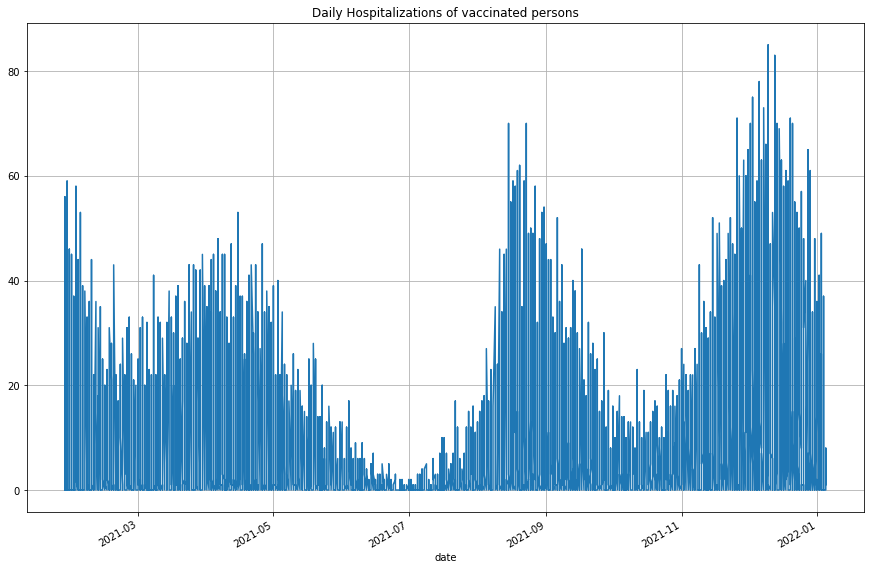

In [24]:
Hosp_vp[Hosp_vp.geoRegion=='CHFL'].entries.plot(figsize=(15,10), grid=True)
plt.title('Daily Hospitalizations of vaccinated persons');
plt.savefig('hosp_vac.png', dpi=200)

### ICU COVID-19 patients

In [25]:
ICU = get_combined_data(['hospCapacity'], georegion=all_cantons, vaccine=False)

In [26]:
ICU.columns = [c.split('_')[-1] for c in ICU.columns]
fig = px.line(ICU,render_mode="SVG")
fig.write_image('ICU_series.png', scale=3)
fig.update_layout(yaxis_title="ICU Patients",
                  title="ICU Patients"
                 )
fig.write_image('ICU_patients.png', scale=3)
fig

In [27]:
ICU

,AG,AI,AR,BE,BL,BS,FL,FR,GE,GL,...,SH,SO,SZ,TG,TI,UR,VD,VS,ZG,ZH
date,,,,,,,,,,,,,,,,,,,,,
2020-04-05,25.785714,0.0,2.428571,26.142857,17.714286,14.928571,0.0,21.142857,61.857143,2.142857,...,3.000000,7.571429,1.714286,11.928571,79.857143,1.285714,82.000000,22.785714,6.428571,37.571429
2020-04-06,26.357143,0.0,2.714286,27.428571,17.714286,14.642857,0.0,21.000000,60.714286,2.142857,...,3.000000,7.857143,1.928571,12.500000,72.571429,1.142857,84.142857,23.071429,6.714286,43.714286
2020-04-07,26.000000,0.0,2.857143,27.857143,17.714286,14.357143,0.0,21.285714,58.428571,2.000000,...,3.000000,8.000000,2.000000,13.214286,64.857143,1.142857,86.142857,23.428571,7.142857,49.857143
2020-04-08,25.571429,0.0,2.714286,28.285714,17.857143,13.785714,0.0,21.142857,56.714286,2.000000,...,3.000000,8.000000,2.142857,14.571429,55.214286,1.000000,84.428571,23.642857,7.714286,52.500000
2020-04-09,24.571429,0.0,2.571429,28.571429,17.857143,13.214286,0.0,20.714286,54.714286,2.000000,...,2.857143,7.857143,2.285714,15.142857,54.357143,0.285714,81.785714,23.571429,8.000000,55.857143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-01-01,24.428571,0.0,0.857143,31.500000,6.571429,16.714286,0.0,8.428571,21.928571,1.714286,...,3.571429,14.857143,2.000000,13.428571,14.000000,2.142857,40.714286,9.000000,5.000000,51.571429
2022-01-02,23.714286,0.0,1.142857,31.000000,6.571429,16.714286,0.0,7.571429,22.357143,1.571429,...,3.285714,14.571429,2.000000,12.857143,14.571429,2.428571,40.928571,9.285714,5.285714,50.857143
2022-01-03,23.000000,0.0,1.142857,29.857143,6.142857,16.571429,0.0,7.000000,23.071429,1.428571,...,3.142857,14.714286,2.142857,12.428571,15.000000,2.428571,41.000000,9.428571,5.285714,50.285714


### Tests

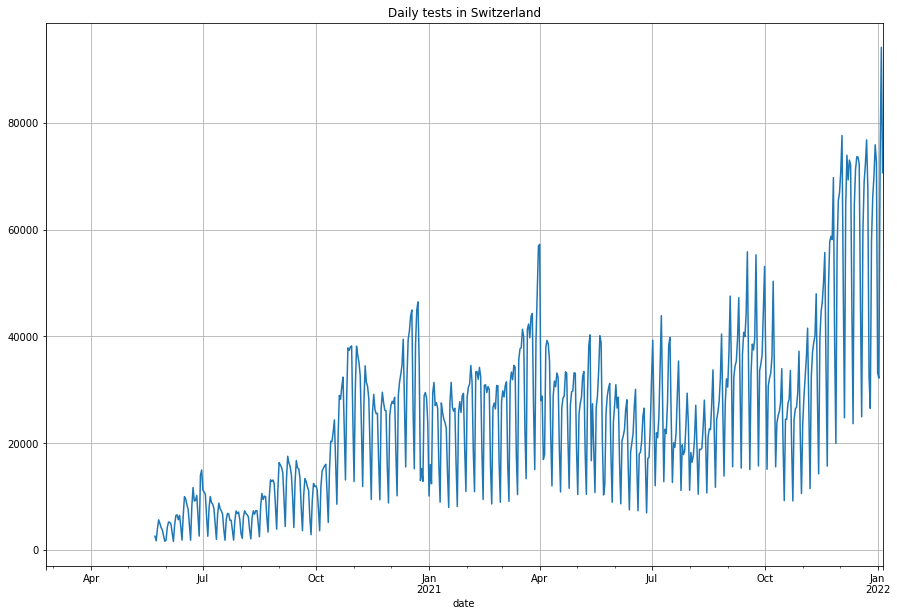

In [28]:
Tests[Tests.geoRegion=='CH'].entries.plot(figsize=(15,10), grid=True)
plt.title('Daily tests in Switzerland');
plt.savefig('tests.png', dpi=200)

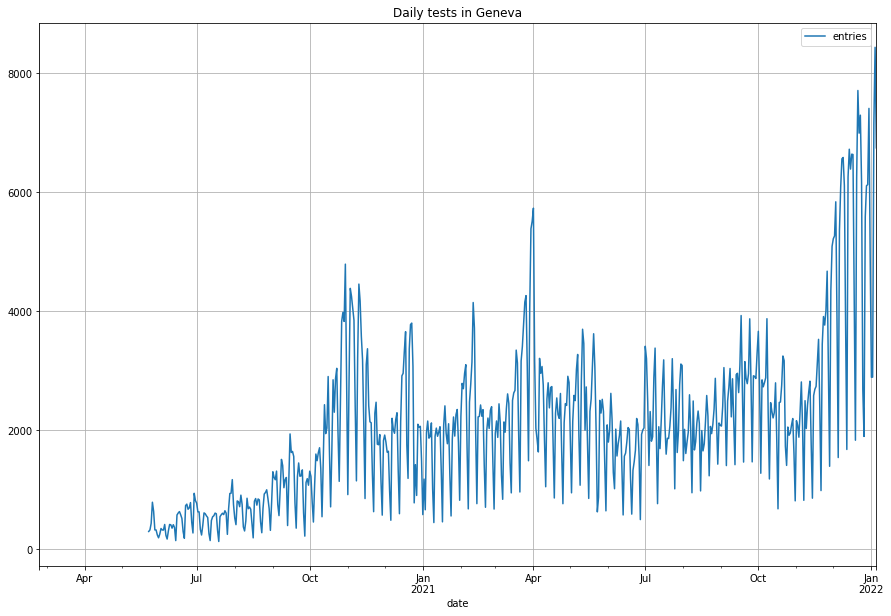

In [29]:
Tests[Tests.geoRegion=='GE'].entries.plot(figsize=(15,10), grid=True)
# Tests[Tests.geoRegion=='GE'].entries.fillna(method='ffill').rolling(7).mean().plot(figsize=(15,10), grid=True, label='7-day MA')
plt.title('Daily tests in Geneva');
plt.legend()
plt.savefig('tests_geneva.png', dpi=200)

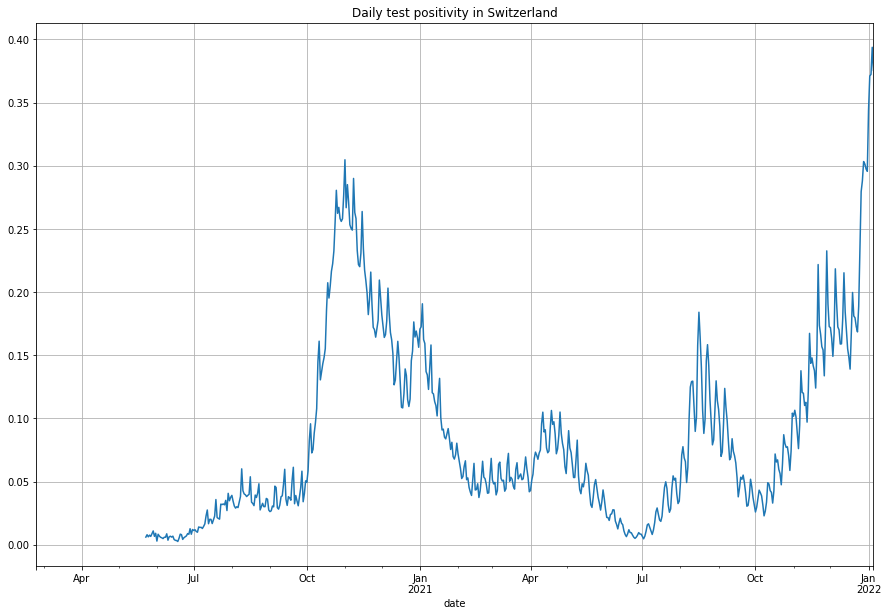

In [30]:
(Tests[Tests.geoRegion=='CH'].entries_pos/Tests[Tests.geoRegion=='CH'].entries).plot(figsize=(15,10), grid=True)
plt.title('Daily test positivity in Switzerland');
plt.savefig('positivity.png', dpi=200)

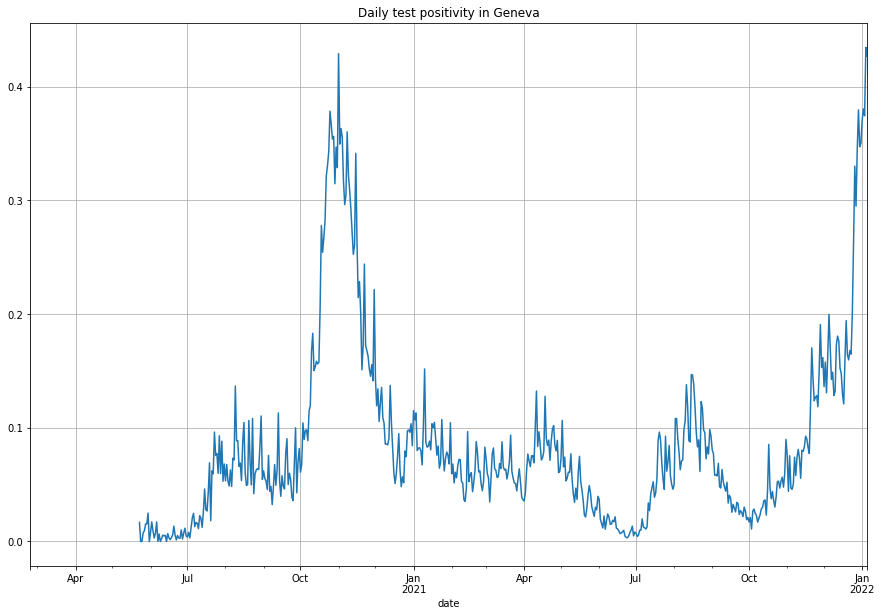

In [31]:
PositivityGE = Tests[Tests.geoRegion=='GE'].entries_pos/Tests[Tests.geoRegion=='GE'].entries
PositivityGE.plot(figsize=(15,10), grid=True)
plt.title('Daily test positivity in Geneva');
plt.savefig('positivity_GE.png', dpi=200)

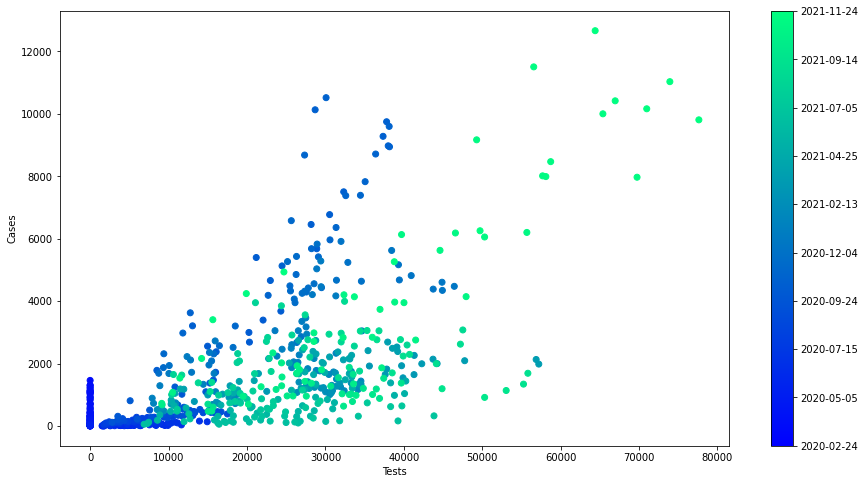

In [32]:
fig, ax = plt.subplots(1,1,figsize=(15, 8))
region = 'CH'
colors = np.linspace(0.1, 1, len(Cases[Cases.geoRegion==region].loc['2020-02-24':'2021-12-07']))#'2021-11-24'
mymap = plt.get_cmap("winter")

x = Tests[Tests.geoRegion==region].loc['2020-02-24':'2021-12-07'].entries.fillna(0)
y = Cases[Cases.geoRegion==region].loc['2020-02-24':'2021-12-07'].entries
# print(x,y)
sc = ax.scatter(x, y, c=colors, cmap=mymap, lw=1)
# ax.xaxis.set_major_formatter(fmt)

plt.ylabel('Cases')
plt.xlabel('Tests')
cb = plt.colorbar(sc)
cb.ax.set_yticklabels([str(p.date()) for p in x[:: (len(x) // 10)+6].index]);

### $Re$

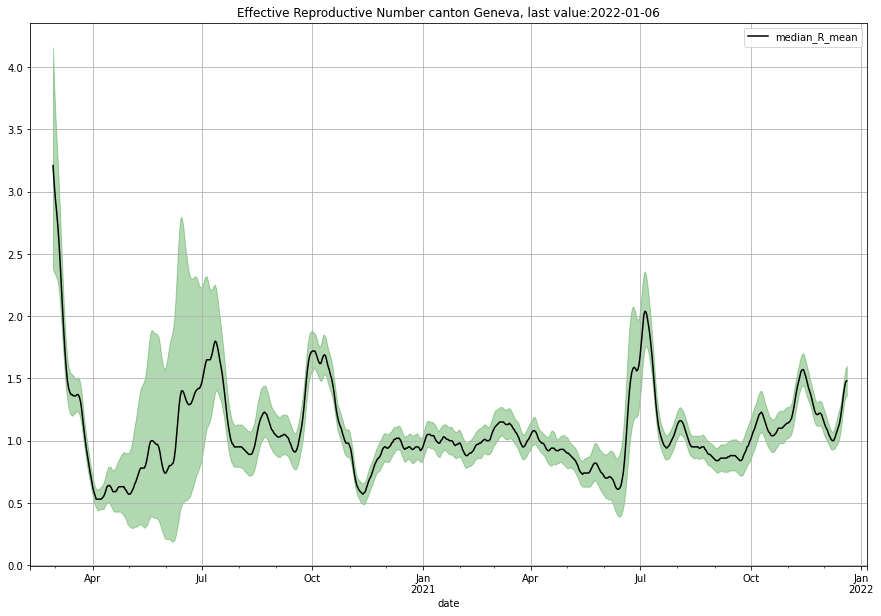

In [33]:
gre = Re[Re.geoRegion=='GE']
ax = gre.median_R_mean.plot(figsize=(15,10), grid=True, color='k');
ax.fill_between(gre.index, gre.median_R_lowHPD, gre.median_R_highHPD, alpha=0.3, color='g');
# ax.set_ylim(0,5)
plt.title(f"Effective Reproductive Number canton Geneva, last value:{gre.index[-1].date()}")
plt.legend();
plt.savefig('re.png', dpi=200)

### Deaths

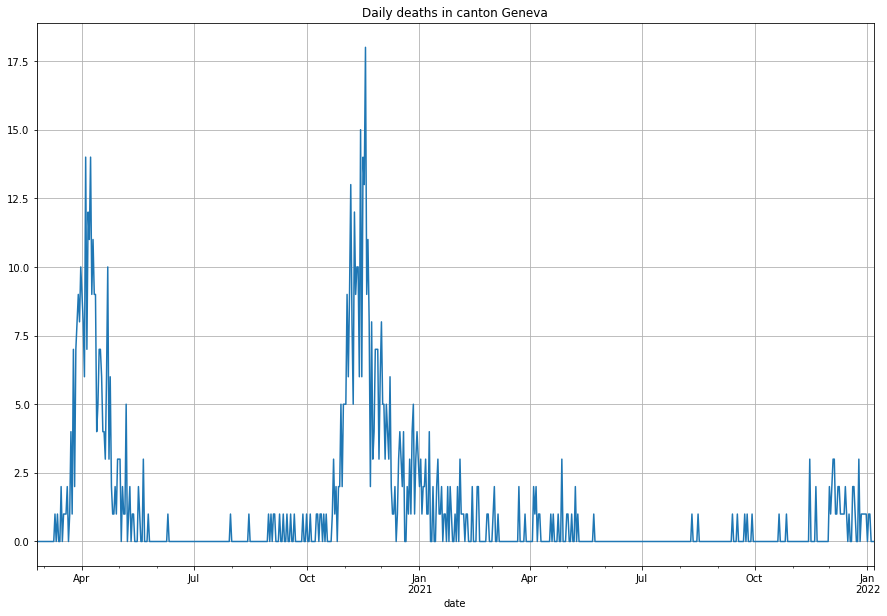

In [34]:
Death[Death.geoRegion=='GE'].entries.plot(figsize=(15,10), grid=True)
plt.title('Daily deaths in canton Geneva');
plt.savefig('deaths_ge.png', dpi=200)

### Hospitalizations *vs* cases
One way to visualize the hospitalization rate  change over time, is to look at a scatterplot  such as the one below 

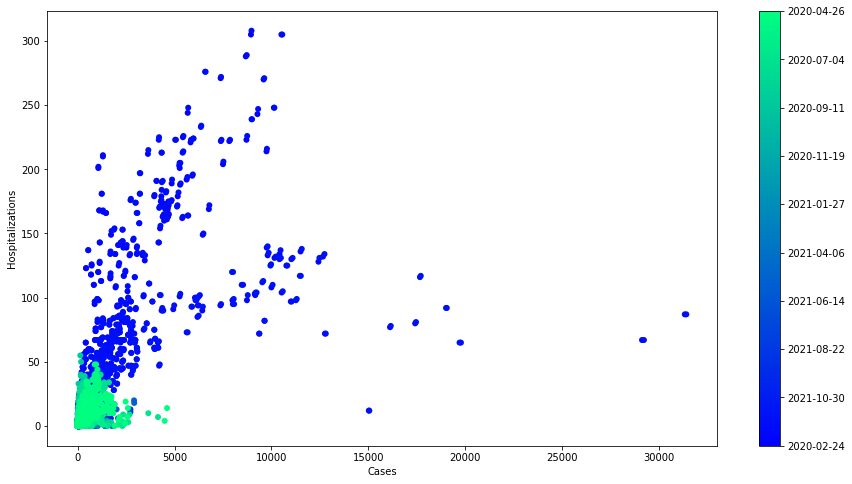

In [35]:
fig, ax = plt.subplots(1,1,figsize=(15, 8))
colors = np.linspace(0.1, 1, len(Hosp))
mymap = plt.get_cmap("winter")
sc = ax.scatter(Cases.entries, Hosp.entries, c=colors, cmap=mymap, lw=0)
plt.ylabel('Hospitalizations')
plt.xlabel('Cases')
cb = plt.colorbar(sc)
cb.ax.set_yticklabels([str(p.date()) for p in Hosp[:: len(Hosp) // 10].index]);
plt.savefig('hospitalizations_cases.png', dpi=300)

If we color the 2 years separately it becomes clearer the reduction of hospitalization rate.

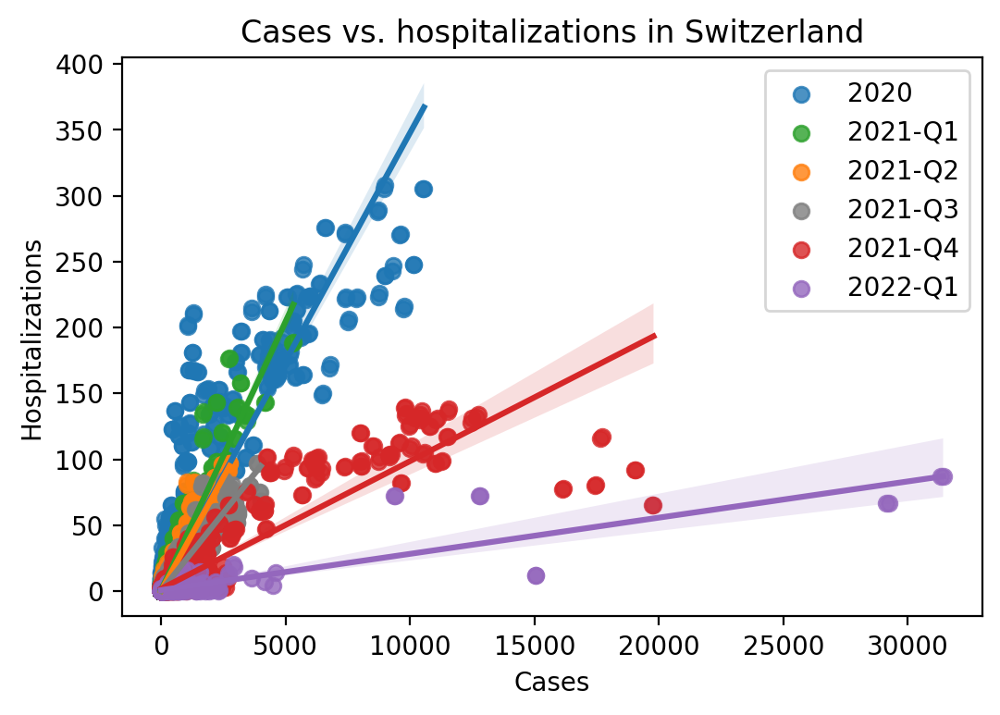

In [37]:
fig, ax = plt.subplots(dpi = 200)
sns.regplot(x=Cases[:'2020-12-31'].entries, y=Hosp[:'2020-12-31'].entries,  label = '2020', color = 'tab:blue', ax=ax )

sns.regplot(x=Cases['2021-01-01':'2021-03-31'].entries,y=Hosp['2021-01-01':'2021-03-31'].entries,  
            label = '2021-Q1', color = 'tab:green', ax=ax )

sns.regplot(x=Cases['2021-04-01':'2021-06-30'].entries,y=Hosp['2021-04-01':'2021-06-30'].entries,  
            label = '2021-Q2', color = 'tab:orange', ax=ax )
sns.regplot(x=Cases['2021-07-01':'2021-09-30'].entries,y=Hosp['2021-07-01':'2021-09-30'].entries,  
            label = '2021-Q3', color = 'tab:gray', ax=ax )
sns.regplot(x=Cases['2021-10-01':'2021-12-31'].entries,y=Hosp['2021-10-01':'2021-12-31'].entries,  
            label = '2021-Q4', color = 'tab:red', ax=ax )
sns.regplot(x=Cases['2022-01-01':'2022-03-31'].entries,y=Hosp['2022-01-01':'2022-03-31'].entries,  
            label = '2022-Q1', color = 'tab:purple', ax=ax )
ax.set_ylabel('Hospitalizations')
ax.set_xlabel('Cases')

ax.set_title('Cases vs. hospitalizations in Switzerland')

ax.legend();
plt.savefig('cases_hosps.png', dpi=200)
# plt.show()

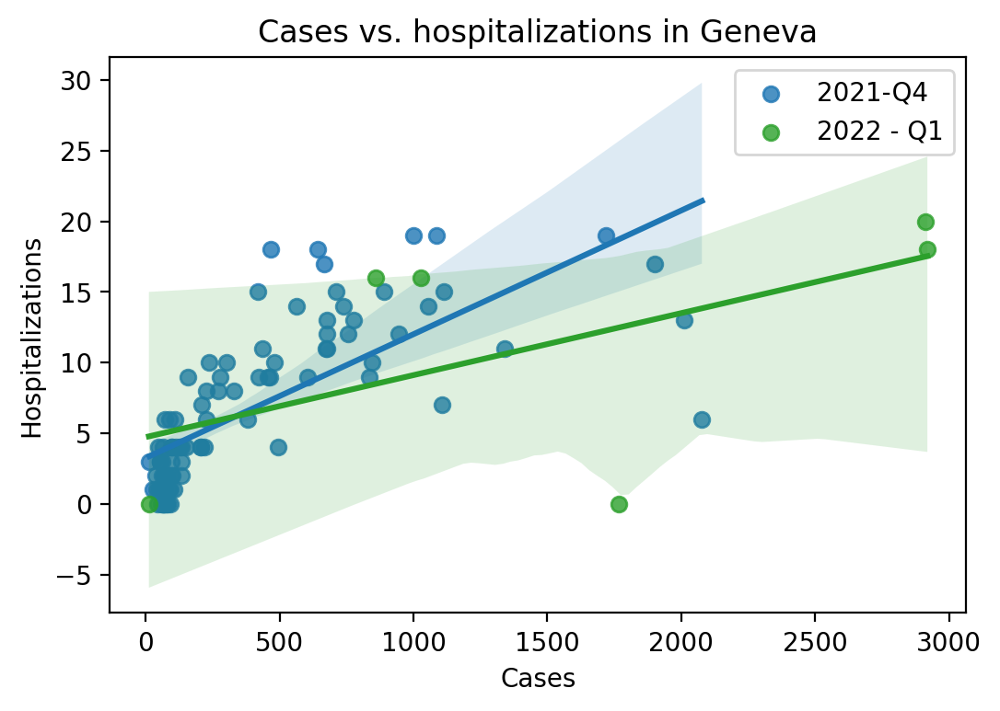

In [39]:
fig, ax = plt.subplots(dpi = 200)
sns.regplot(x=Cases[Cases.geoRegion=='GE']['2021-10-01':'2021-12-31'].entries, 
            y=Hosp[Hosp.geoRegion=='GE']['2021-10-01':'2021-12-31'].entries,  
            label = '2021-Q4', color = 'tab:blue', ax=ax )

sns.regplot(x=Cases[Cases.geoRegion=='GE']['2022-01-01':'2022-03-31'].entries,
            y=Hosp[Hosp.geoRegion=='GE']['2022-01-01':'2022-03-31'].entries,  
            label = '2022 - Q1', color = 'tab:green', ax=ax )


ax.set_ylabel('Hospitalizations')
ax.set_xlabel('Cases')

ax.set_title('Cases vs. hospitalizations in Geneva')

ax.legend();
plt.savefig('cases_hosps.png', dpi=200)

In [134]:
fig=px.scatter(
        x=Cases[Cases.geoRegion == 'GE']['2021-10-01':'2021-12-31'].entries,
        y=Hosp[Hosp.geoRegion == 'GE']['2021-10-01':'2021-12-31'].entries,
        labels={'entries':'2021-Q4'},
        trendline="lowess",
        render_mode="SVG")

fig.add_scatter(
        x=Cases[Cases.geoRegion == 'GE']['2022-01-01':'2022-03-31'].entries,
        y=Hosp[Hosp.geoRegion == 'GE']['2022-01-01':'2022-03-31'].entries,
        mode='markers',
#         color='green',
        name='2022-Q1',
#         trendline="lowess"
    )
fig.update_layout(xaxis_title='Daily new cases',
                  yaxis_title='Daily hospitalizations',
                  title=f'Case series for all cantons')

fig

## Cross-Correlation analysis

As the virus spreads through geographical space, it leaves a trace of its path in the delays between the incidence curves in different places. We can use the cross-correlation between series to estimate not only this spatial trajectory (through the time lags), but also look at strength with which one location affects the other: the magnitude of the the pairwise correlations between all cantons).
To obtain the lag $\tau$ between two series we can look for the lag that maximizes the cross-correlation coefficient between 2 cantons.  

The cross-correlation function for timeseries is given by:

$$\rho_{XY}(\tau)={\frac {\operatorname{E} \left[\left(X_{t}-\mu _{X}\right){\overline {\left(Y_{t+\tau }-\mu _{Y}\right)}}\right]}{\sigma _{X}\sigma _{Y}}}.$$

The sign of $\tau$ that maximizes the cross-correlation function, is a proxy of the direction of predictability, i.e., if $\rho_{XY}(\tau>0)$ it means that canton $X$ anticipates $Y$ in incidence trends, and can thus be a good predictor for the $Y$.

In [69]:
def get_lag(x,y,maxlags=5, smooth=True):
    if smooth:
        x = pd.Series(x).rolling(7).mean().dropna().values
        y = pd.Series(y).rolling(7).mean().dropna().values
    corr = correlate(x,y, mode='full')/np.sqrt(np.dot(x,x)*np.dot(y,y))
    slice = np.s_[(len(corr)-maxlags)//2:-(len(corr)-maxlags)//2]
    corr = corr[slice]
    lags = correlation_lags(x.size,y.size,mode='full')
    lags = lags[slice]
    lag = lags[np.argmax(corr)]
    

#     lag = np.argmax(corr)-(len(corr)//2)

    return lag, corr.max()

def lag_ccf(a,maxlags=30,smooth=True):
    """
    Calculate the full correlation matrix based on the maximum correlation lag 
    """
    ncols = a.shape[1]
    lags = np.zeros((ncols,ncols))
    cmat = np.zeros((ncols,ncols))
    for i in range(ncols): 
        for j in range(ncols):
#             if j>i:
#                 continue
            lag, corr = get_lag(a.T[i],a.T[j], maxlags, smooth)
            cmat[i,j] = corr
            lags[i,j] = lag
    return cmat,lags

### Preparing the data
First we have to prepare a data frame with the incidence series by canton on the columns. 

In [70]:
inc_canton = Cases.pivot(columns='geoRegion', values='entries')
del inc_canton['CHFL']
del inc_canton['CH']
# inc_canton.plot(figsize=(15,10));
fig=px.line(inc_canton.rolling(7).mean().dropna(),render_mode="SVG")
fig.update_layout(xaxis_title='Time (days)',
                  yaxis_title='Cases',
                  title = f'Case series for all cantons'
)
fig.write_image('canton_series.png', scale=3)
fig.write_html('canton_series.html')
fig.show()

### Calculating the cross-correlations
If we take a closer look selected cantons we see that the most recent wave started a little earlier on some cantons, relative to Geneva. Notice that we also include the Austrian curve for reference.

In [71]:
# inc_canton[['BL',"GE"]].rolling(7).mean().dropna().plot(figsize=(15,10));
fig = px.line(inc_canton[['ZH','BE', 'AG', 'VD', 'SZ',"GE", 'JU']].rolling(7).mean().dropna(),render_mode="SVG")
cau = Cases_au.rolling(7).mean().dropna()
fig.add_scatter(x=cau.index, y=cau, name='Vienna')
fig.write_image('lagged_series.png', scale=3)
fig

Looking at the cross correlation plot for some pairs of cantons, we can see that the lag between them is not $0$, which gives us hope that we can use other series for predictive purposes.

In [72]:
def plot_xcorr(X='ZH',Y='GE', fromdt='2020-10-01'):
    """
    Plots the Cross correlation between two series identifying the lag
    """
    date_from = fromdt
    x=inc_canton.loc[date_from:][X].rolling(7).mean().dropna().values
    y=inc_canton.loc[date_from:][Y].rolling(7).mean().dropna().values
    corr = correlate(x,y, mode='full')/np.sqrt(np.dot(x,x)*np.dot(y,y))
    lags = correlation_lags(x.size,y.size, mode='full')
    lag = lags[np.argmax(corr)]#-((len(corr)//2))
    fig = px.line(x=lags, y=corr, #np.arange(-len(corr)//2,len(corr)//2)
                  render_mode="SVG"
                 )
    fig.update_layout(xaxis_title='lag(days)',
                      yaxis_title='Cross-correlation',
                      title = f'Cross-correlation function between cantons {X} and {Y}. Lag: {lag} days.\nSince: {fromdt}'
    )
    fig.add_shape(type='line',
                    yref="y",
                    xref="x",
                    x0=lag,
                    y0=0,
                    x1=lag,
                    y1=corr.max()*1.05,
                    line=dict(color='black', width=1))
    fig.add_annotation(
                    x=lag,
                    y=1.06,
                    yref='paper',
                    showarrow=False,
                    text=f'Max correlation: {corr.max():2f}')
    return fig
plot_xcorr('VS', 'TI')

It's even better to look at all pairwise cross-correlations.

In [73]:
cm,lm=lag_ccf(inc_canton.values)

In [74]:
inc_canton.columns

Index(['AG', 'AI', 'AR', 'BE', 'BL', 'BS', 'FL', 'FR', 'GE', 'GL', 'GR', 'JU',
       'LU', 'NE', 'NW', 'OW', 'SG', 'SH', 'SO', 'SZ', 'TG', 'TI', 'UR', 'VD',
       'VS', 'ZG', 'ZH'],
      dtype='object', name='geoRegion')

In [75]:
# xc = inc_canton.rolling(14).corr(pairwise=True)

In [76]:
# xc.index.levels[0]

In [77]:
# px.line(x=xc.index.levels[0],y=xc.xs('VD',level=1).GE)

In [78]:
fig = px.imshow(cm,
          labels=dict(x="Cantons", y="Cantons", color="Correlation"),
          x=inc_canton.columns,
          y=inc_canton.columns,
          title='Cross-correlation Matrix'
         )
fig.update_layout(width=600,height=600)
fig.write_image('Cross-corr_matrix.png', scale=3)
fig.show()

In [79]:
fig = px.imshow(lm,
                labels=dict(x="Cantons", y="Cantons", color="Lag"),
                x=inc_canton.columns,
                y=inc_canton.columns,
                title='Highest correlation lag',
                color_continuous_scale='puor'
          
         )
fig.update_layout(width=600,height=600)
fig.write_image('canton_lag_matrix.png', scale=3)
fig.show()

### Clustering the Series based on correlation

In [95]:
import scipy.cluster.hierarchy as hcluster


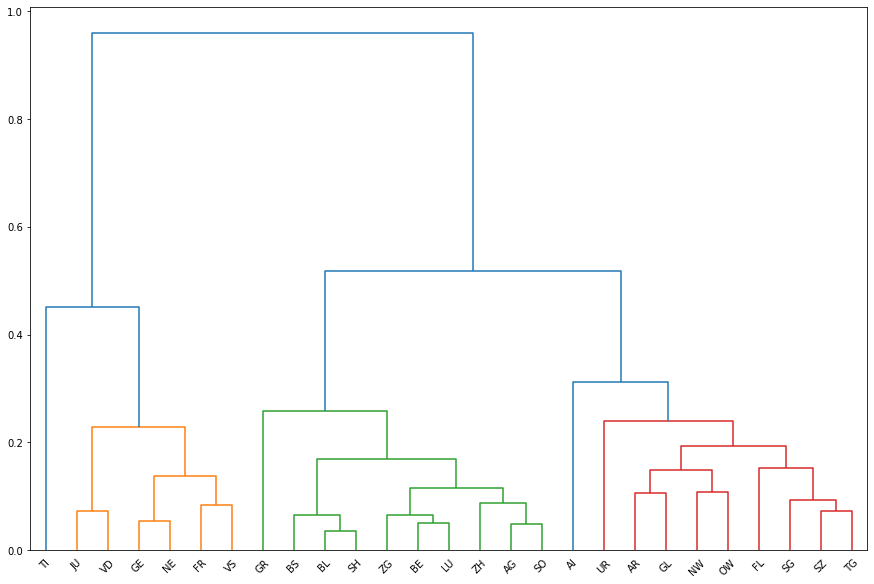

In [96]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
linkage = hcluster.linkage(cm, method='complete')
dendro  = hcluster.dendrogram(linkage, labels=inc_canton.columns, color_threshold=0.3, ax=ax)
plt.savefig('dendro.png', dpi=300)

In [82]:
# computing the cluster 
    
ind = hcluster.fcluster(linkage, 0.6, 'distance')

grouped = pd.DataFrame(list(zip(ind,inc_canton.columns))).groupby(0) # preciso entender melhor essa linha do código 
clusters = [group[1][1].values for group in grouped]

all_regions = inc_canton.columns
clusters

[array(['FR', 'GE', 'JU', 'NE', 'TI', 'VD', 'VS'], dtype=object),
 array(['AG', 'AI', 'AR', 'BE', 'BL', 'BS', 'FL', 'GL', 'GR', 'LU', 'NW',
        'OW', 'SG', 'SH', 'SO', 'SZ', 'TG', 'UR', 'ZG', 'ZH'], dtype=object)]

In [83]:
all_regions

Index(['AG', 'AI', 'AR', 'BE', 'BL', 'BS', 'FL', 'FR', 'GE', 'GL', 'GR', 'JU',
       'LU', 'NE', 'NW', 'OW', 'SG', 'SH', 'SO', 'SZ', 'TG', 'TI', 'UR', 'VD',
       'VS', 'ZG', 'ZH'],
      dtype='object', name='geoRegion')

## Geo visualization

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
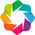

In [84]:
import pandas as pd
import geopandas as gpd
import geoviews as gv
gv.extension('bokeh')

In [85]:
lagsGE = pd.DataFrame(index= inc_canton.columns, data={'lags':lm[8,:]})
corrsGE = pd.DataFrame(index= inc_canton.columns, data={'corr':cm[8,:]})
# lagsGE

In [86]:
chmap = gpd.read_file('map/cantons.gpkg')
chmap = chmap.to_crs(epsg=4326)
chmap['geoRegion'] = chmap.HASC_1.transform(lambda x: x.split('.')[-1])
chmap_lag = pd.merge(left=chmap, right=lagsGE, on='geoRegion')
chmap_lag

,GID_0,NAME_0,GID_1,NAME_1,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,geometry,geoRegion,lags
0,CHE,Switzerland,CHE.1_1,Aargau,Argovia|Arg¢via|Argovie,None,Canton|Kanton|Chantun,Canton,None,CH.AG,"MULTIPOLYGON (((7.94951 47.27751, 7.94897 47.2...",AG,0.0
1,CHE,Switzerland,CHE.2_1,Appenzell Ausserrhoden,Appenzell Ausser-Rhoden|Appenzell Outer Rhodes...,None,Canton|Kanton|Chantun,Canton,None,CH.AR,"MULTIPOLYGON (((9.20708 47.27694, 9.20828 47.2...",AR,1.0
2,CHE,Switzerland,CHE.3_1,Appenzell Innerrhoden,Appenzell Inner-Rhoden|Appenzell Inner Rhodes|...,None,Canton|Kanton|Chantun,Canton,None,CH.AI,"MULTIPOLYGON (((9.51250 47.40100, 9.51430 47.4...",AI,11.0
3,CHE,Switzerland,CHE.4_1,Basel-Landschaft,Bâle-Campagne|Basel-Country|Baselland|Basel-La...,None,Canton|Kanton|Chantun,Canton,None,CH.BL,"MULTIPOLYGON (((7.36526 47.41939, 7.36377 47.4...",BL,0.0
4,CHE,Switzerland,CHE.5_1,Basel-Stadt,Bâle-Ville|Basel-City|Basel-Town|Basilea-Citad...,None,Canton|Kanton|Chantun,Canton,None,CH.BS,"MULTIPOLYGON (((7.55254 47.54676, 7.55290 47.5...",BS,0.0
5,CHE,Switzerland,CHE.6_1,Bern,Berna|Berne,None,Canton|Kanton|Chantun,Canton,None,CH.BE,"MULTIPOLYGON (((7.09284 46.89419, 7.09202 46.8...",BE,0.0
6,CHE,Switzerland,CHE.7_1,Fribourg,Freiburg|Friburg|Friburgo,None,Canton|Kanton|Chantun,Canton,None,CH.FR,"MULTIPOLYGON (((6.78575 46.73603, 6.78559 46.7...",FR,0.0
7,CHE,Switzerland,CHE.8_1,Genève,Cenevre|Genebra|Geneve|Geneva|Genevra|Genf|Gin...,None,Canton|Kanton|Chantun,Canton,None,CH.GE,"MULTIPOLYGON (((6.23440 46.33147, 6.23259 46.3...",GE,0.0
8,CHE,Switzerland,CHE.9_1,Glarus,Glaris|Glarona|Glaruna,None,Canton|Kanton|Chantun,Canton,None,CH.GL,"MULTIPOLYGON (((8.90771 46.80860, 8.90603 46.8...",GL,0.0
9,CHE,Switzerland,CHE.10_1,Graubünden,Graubünden|Grigioni|Grischun|Grisons,None,Canton|Kanton|Chantun,Canton,None,CH.GR,"MULTIPOLYGON (((10.22766 46.61207, 10.22734 46...",GR,0.0


In [87]:
swmap = gv.Polygons(chmap, vdims=['NAME_1', 'geoRegion', 'lags'], label='Lag from canton Geneva').opts(
    tools=['hover'], width=800, height=500, color='lags', cmap='seismic', symmetric=True,
    colorbar=True, toolbar='above', xaxis=None, yaxis=None)
swmap

DataError: Expected Polygons instance to declare two key dimensions corresponding to the geometry coordinates but 3 dimensions were found which did not refer to any columns.

GeoPandasInterface expects a list of tabular data, for more information on supported datatypes see http://holoviews.org/user_guide/Tabular_Datasets.html

In [ ]:
chmap_corr = pd.merge(left=chmap, right=corrsGE, on='geoRegion')
chmap_corr.plot(column='corr')

In [ ]:
swmap_c = gv.Polygons(chmap_corr, vdims=['NAME_1', 'geoRegion', 'corr'], label='Correlation with canton Geneva').opts(
    tools=['hover'], width=800, height=500, color='corr', cmap='Viridis', symmetric=False,
    colorbar=True, toolbar='above', xaxis=None, yaxis=None)
swmap_c

### Network analysis
We can take the correlation matrix and build a network to represent the association between the cantons. for this network we will filter only correlations greater than $0.7$. We will use the correlation as the weight of each edge.

In [ ]:
import holoviews as hv
from holoviews.operation.datashader import datashade, bundle_graph
import networkx as nx
import infomap
from networkx.algorithms import community
hv.extension('bokeh')

defaults = dict(width=400, height=400)
hv.opts.defaults(
    hv.opts.EdgePaths(**defaults), hv.opts.Graph(**defaults), hv.opts.Nodes(**defaults))

In [88]:
adj = copy.deepcopy(cm)
adj[adj<0.7]=0
G = nx.from_numpy_matrix(adj, parallel_edges=False, create_using=nx.MultiDiGraph)
# Relabel nodes
G = nx.relabel_nodes(G, {n: f"{i}" for n,i in enumerate(inc_canton.columns)})
G.remove_node('FL')
G['AG']['GE']

NameError: name 'nx' is not defined

#### Infomap graph

In [89]:
im = infomap.Infomap()
nodeids = {i:n for n,i in enumerate(inc_canton.columns)}
for s,d,w in G.edges(data=True):
    im.add_link(nodeids[s],nodeids[d],w['weight'])
    

NameError: name 'infomap' is not defined

In [90]:
im.run(preferred_number_of_modules=4)

print(f"Found {im.num_top_modules} modules with codelength: {im.codelength}")

print("Result")
print("\n#node module")
for node in im.tree:
    if node.is_leaf:
        print(node.node_id, node.module_id)

NameError: name 'im' is not defined

In [91]:
positions = {c: chmap[chmap.geoRegion==c].geometry.centroid.values[0].coords[0]
                  for c in inc_canton.columns if c!='FL'};
# positions

#### Community detection
The greedy moodularity algorithm detects two communities

In [92]:
comms = list(community.greedy_modularity_communities(G, weight='weight'))
nx.set_node_attributes(G, {n:'west' if n in comms[0] else 'east' for n in G.nodes} ,name='Community')
for c in comms:
    print(c)

NameError: name 'community' is not defined

In [93]:
## Coloring nodes according to community

In [94]:
def plot_network(G):
    colors = ['#000000']+hv.Cycle('Category20').values
    graph = hv.Graph.from_networkx(G, positions,#nx.layout.kamada_kawai_layout, 
                                   weight='weight',
                                    ).opts(tools=['hover'],
                                                         cmap=colors,
                                                         node_size=20,
                                                         node_fill_color='Community',
                                                         xaxis=None, 
                                                         yaxis=None, 
                                                         width=800, height=500
                                                        )
    labels = hv.Labels(graph.nodes, ['x', 'y'], 'index')
    bg = bundle_graph(graph)
    return bg*labels.opts(text_font_size='8pt', text_color='white')
fig = plot_network(G)
hv.save(fig, 'net_communities.png', backend='matplotlib')
fig

NameError: name 'G' is not defined

In [ ]:
# plot_network(G.subgraph(comms[0]))

In [67]:
# plot_network(G.subgraph(comms[1]))

## Bayesian Inference
We would like to infer from the data some basic rates.

In [67]:
import arviz as az
import numpy as np
import pymc3 as pm
import os

We start by restricting our observations to 2021. So for the case series we have:

In [68]:
Cases21 = Cases.loc['2021-01-01':]
Cases21GE = Cases21[Cases21.geoRegion=='GE']
Cases21GE

,geoRegion,datum,entries
date,,,
2021-01-01,GE,2021-01-01,64
2021-01-02,GE,2021-01-02,126
2021-01-03,GE,2021-01-03,74
2021-01-04,GE,2021-01-04,153
2021-01-05,GE,2021-01-05,163
...,...,...,...
2021-12-26,GE,2021-12-26,563
2021-12-27,GE,2021-12-27,1720
2021-12-28,GE,2021-12-28,1861


For the Test series we have:

In [69]:
Test21 = Tests.loc['2021-01-01':]
Test21GE = Test21[Test21.geoRegion=='GE']
Test21GE

,datum,entries,entries_pos,geoRegion
date,,,,
2021-01-01,2021-01-01,581,66,GE
2021-01-02,2021-01-02,1178,125,GE
2021-01-03,2021-01-03,663,75,GE
2021-01-04,2021-01-04,1962,157,GE
2021-01-05,2021-01-05,2155,177,GE
...,...,...,...,...
2021-12-25,2021-12-25,2674,691,GE
2021-12-26,2021-12-26,1895,625,GE
2021-12-27,2021-12-27,5588,1650,GE


In [70]:
Positivity21GE = PositivityGE.loc['2021-01-01':]

And finally, the hospitalization series become:

In [71]:
Hosp21 = Hosp['2021-01-01':]
Hosp21GE = Hosp21[Hosp21.geoRegion=='GE']
Hosp21GE

,geoRegion,datum,entries
date,,,
2021-01-01,GE,2021-01-01,6
2021-01-02,GE,2021-01-02,4
2021-01-03,GE,2021-01-03,5
2021-01-04,GE,2021-01-04,5
2021-01-05,GE,2021-01-05,2
...,...,...,...
2021-12-26,GE,2021-12-26,12
2021-12-27,GE,2021-12-27,15
2021-12-28,GE,2021-12-28,13


### Cases and Hospitalizations as Binomial processes with variable rates
If we treat cases and hospitalizations as bionomial processes, we can estimate their variable rates. From the Test series, $T_t$ we can model the prevalence series in the population, $Pv_t \sim Beta (\alpha, \beta)$ as

$$Cases_t \sim Bin(n=T_t, p=Pv_t).$$

In a similar fashion, we can model the probability of Hospitalization, $Ph_t \sim Beta (\alpha, \beta)$ as

$$Hospitalizations_t \sim Bin(n=Cases_t, p=Ph_t).$$

In [72]:
with pm.Model() as var_bin:

    # Prevalence
    prev = pm.Beta("Prevalence", .5,.5, shape=len(Cases21GE)-1)
    cases = pm.Binomial("cases",n=Test21GE.entries.values,p=prev, observed=Cases21GE.entries.values[:-1])
    
    probs = pm.Beta("Phosp", .5,.5, shape=len(Cases21GE)-1)
    
    hosp = pm.Binomial("Hospitalizations", n=Cases21GE.entries.values[:-1], p=probs, observed=Hosp21GE.entries.values[:-1])

In [73]:
with var_bin:
    tracevb = pm.sample(2000, tune=500, return_inferencedata=True)
#     axes_arr = az.plot_trace(tracevb)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Phosp, Prevalence]


Sampling 4 chains for 500 tune and 2_000 draw iterations (2_000 + 8_000 draws total) took 25 seconds.


The diagram of our inference becomes:

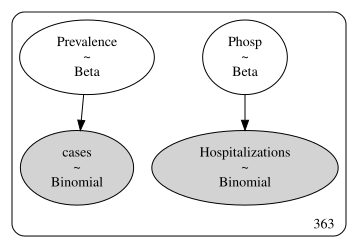

In [74]:
pm.model_graph.model_to_graphviz(var_bin)

Which after our estimation yields the following  probability distribution over time for the prevalence. Notice that it matches quite well the test positivity data (purple dots).

In [75]:
Prev_post = pd.DataFrame(index=Cases21GE.index[:-1], 
                         data={'median': tracevb.posterior.Prevalence.median(axis=(0,1)),
           'lower': np.percentile(tracevb.posterior.Prevalence, 2.5, axis=(0,1)),
           'upper': np.percentile(tracevb.posterior.Prevalence,97.5, axis=(0,1)),
          })
fig = px.line(Prev_post.rolling(7).mean().dropna())
# fig.add_scatter(x=Prev_post.index, y=Prev_post.lower, mode='none', fill='tonexty', name="95% CI")
fig.add_scatter(x=Positivity21GE.index, y=Positivity21GE.values, name='Test positivity', mode='markers')
fig.update_layout(title="Estimated prevalence of COVID in the population of Geneva",
                  yaxis_title = "Prevalence of infected",
                  xaxis_title = "Time (days)"
                 )
fig.write_image('prevalence_est.png', scale=3)
fig.show()

In [76]:
Phosp_post = pd.DataFrame(index=Cases21GE.index[:-1], data={'median': tracevb.posterior.Phosp.median(axis=(0,1)),
           'lower': np.percentile(tracevb.posterior.Phosp, 2.5, axis=(0,1)),
           'upper': np.percentile(tracevb.posterior.Phosp,97.5, axis=(0,1)),
          })
# df = pd.DataFrame(index=Cases21GE.index[:-1], data=Phosp_post)
fig = px.line(Phosp_post.rolling(7).mean().dropna())
# fig.add_scatter(x=Positivity21GE.index, y=Cases21GE.values, name='Test positivity', mode='markers')
fig.update_layout(title="Estimated Probability of Hospitalization in Geneva",
                  yaxis_title = "probability",
                 )
# fig.add_scatter(x=Phosp_post.index, y=Phosp_post.upper, mode='none', fill='tonexty', name="95% CI")
fig.write_image('phosp.png', scale=3)
fig.show()

### SIR-based Forecasting
The FOPH makes available the daily estimates of the effective reproductive number, $R_t$. With a goo estimate of R_t it is possible to simulate growth based on transmission models. Since for the SIR model, 
$$R_t = R_0 S(t)= \frac{\beta}{\gamma}S(t),$$
we can use it to parameterize a simple transmission model with which to forcast cases and thus hospitalizations. We would normally write the SIR model as:

\begin{align}
\frac{dS}{dt} &= -\beta S(t)I(t)\\
\frac{dI}{dt} &= \beta S(t)I(t) -\gamma I(t)
\end{align}

From the $R_t$ time series, we can derive a time-dependent transmission parameter, 
$$\beta=\frac{R_t \gamma}{S(t)}.$$

Then we can re-write the SIR model as

\begin{align}
\frac{dS}{dt} &= -R_t\gamma I(t)\\
\frac{dI}{dt} &= R_t\gamma I(t) -\gamma I(t) \label{eq:I}
\end{align}

We can reduce the system above to just equation \ref{eq:I}, which has the following solution:

$$I(t) = I(0) e^{\left[\int R_t dt-t\right]\gamma \label{eq:sol}}$$

The *prevalence* in the population that we estimated before, in the SIR model is given by $I(t)$. We can see that its evolution is dependent on the cumulative  effect of $R_t$.

To estimate the daily values of $R_t$, we need to discretize the above expression. If we take the log of \ref{eq:sol}:

\begin{align}
log I(t) =& log I_0 -\gamma t + \gamma \int R_t dt\\
=& log I_0 -\gamma t + \gamma \sum_{t=0}^T R_t
\end{align}

We can then solve it for 2 consecutive points $t_1$ and $t_2$.

$$log I(t_1) = log I_0 -\gamma t_1 + \gamma \sum_{0}^{t_1} R_t $$
and
$$log I(t_2) = log I_0 -\gamma t_2 + \gamma \sum_{0}^{t_2} R_t $$

and subtract the latter from the former we get:

\begin{align}
log I(t_2) -log I(t-1) =& \gamma t_1 -\gamma t_2 -\gamma \sum_0^{t_1}R_t + \gamma \sum_{0}^{t_2}R_t\\
=& \gamma (t_1-t_2) -\gamma\sum_{t_1}^{t_2}R_t 
\end{align}

which will lead to the following expression for $R_t$ at $t_2$: 

$$R_t=\frac{log I(t_2)- log I(t_1)}{\gamma}+1$$

In [77]:
from pymc3.ode import DifferentialEquation
from pymc3.distributions.dist_math import SplineWrapper
import plotly.graph_objects as go 
from scipy.integrate import odeint
from scipy.interpolate import interp1d

Let's apply this inference just to the last wave starting on october, 15th. To facilitate the fit to the model let's also use the 7-day moving average of it.

In [78]:
prev = Prev_post.loc['2021-10-02':]['median'].rolling(7).mean().dropna()
fig=px.line(prev.iloc[:-1], render_mode="SVG")
fig.add_scatter(x=Prev_post.loc['2021-10-08':].index,
                y=Prev_post.loc['2021-10-08':]['median'].values, 
                mode='lines+markers', name="raw")
fig.update_layout(yaxis_title="prevalence", title="Median smothed and raw estimated prevalence for Geneva")

In [79]:
rtge = gre.median_R_mean.loc['2021-10-14':]
rtge_short = rtge.loc[:'2021-11-22'] # Last days are NaNs
prev_short = prev.loc[:'2021-11-22']
rtge_filled = rtge.fillna(method='ffill')[:-2]
prev =prev[:-1] # removing last point
# nnan = len(rtge)-len(rtge.dropna())
# rtge_filled.iloc[-nnan:] = np.linspace(1.3,2,nnan)
with pm.Model() as model_gam:
    sig = pm.HalfCauchy('𝜎',0.05)
#     sig_rt = pm.Uniform("sigma_rt",.05, 2)
#     gam = pm.Uniform("𝛾", 0.1399, 0.142) #7 days transmission period
    gam=1/7
    i0 = pm.Beta("I(0)", mu=0.001, sigma=.005)
    rtplus = pm.Uniform("Rt",0.8, 1.2, shape=len(prev))
#     rtplus = pm.Bound(pm.Normal,lower=0.8,upper=2)("Rt",mu=1.15, sd=0.5, shape=len(prev))
#     rtplus = pm.Gamma("Rt",mu=1, sigma=0.3, shape=len(rtge_filled))
    t=np.arange(len(prev))
    rhs = pm.Deterministic("Prev", i0*pm.math.exp((rtplus-1)*gam*t))
    I = pm.Beta("I(t)", mu = rhs, sigma=sig, observed=prev.values)

In [107]:
1/7

0.14285714285714285

The structure of the probabilistic model is depicted below.

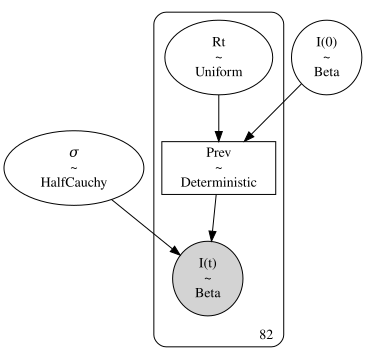

In [80]:
pm.model_graph.model_to_graphviz(model_gam)

In [81]:
with model_gam:
    tracegam = pm.sample(5000,tune=3500,start={'I(0)':0.01,'𝜎':.05},#,"𝛾":0.14},
                         init='auto', 
                         target_accept=0.9,
                         return_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Rt, I(0), 𝜎]


Sampling 4 chains for 3_500 tune and 5_000 draw iterations (14_000 + 20_000 draws total) took 65 seconds.
The acceptance probability does not match the target. It is 0.8163752898729918, but should be close to 0.9. Try to increase the number of tuning steps.
The rhat statistic is larger than 1.2 for some parameters.
The estimated number of effective samples is smaller than 200 for some parameters.


In [90]:
tracegam

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

The posterior distribution of $\gamma$ and $I(0)$ is shown below.

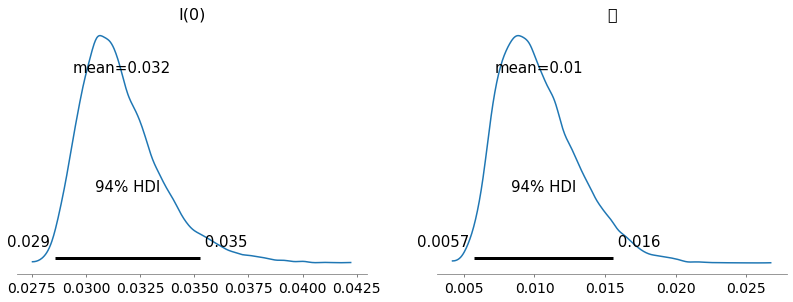

In [92]:
az.plot_posterior(tracegam, var_names=['I(0)', '𝜎']);
plt.savefig('parpriors.png', dpi=300)

In [93]:
inc_post = pd.DataFrame(index=prev.index, 
                         data={'median': tracegam.posterior.Prev.median(axis=(0,1)),
           'lower': np.percentile(tracegam.posterior.Prev, 2.5, axis=(0,1)),
           'upper': np.percentile(tracegam.posterior.Prev,97.5, axis=(0,1)),
          })
fig = px.line(inc_post, render_mode="SVG")
fig.add_scatter(x=prev.index, y=inc_post.lower, mode='none', fill='tonexty', name="95% CI")
fig.add_scatter(x=prev.index, y=prev.values, name='Test positivity', mode='markers')
fig.update_layout(title="Prevalence estimates from the SIR model", yaxis_title="I(t)")
fig.write_image('SIR_bayes.png', scale=3)
fig.show()

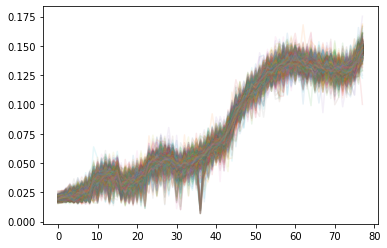

In [159]:
plt.plot(tracegam.posterior.Prev[1,:,:].T, alpha=0.1);

In [90]:
# t=np.arange(len(rtge_filled))
# plt.plot(t, .03*np.exp((rtge_filled.values-1)*.03*t))

In [94]:
rt_post = pd.DataFrame(index=prev.index, 
                         data={'median': tracegam.posterior.Rt.median(axis=(0,1)),
           'lower': np.percentile(tracegam.posterior.Rt, 2.5, axis=(0,1)),
           'upper': np.percentile(tracegam.posterior.Rt,97.5, axis=(0,1)),
          })
fig = px.line(rt_post, render_mode="SVG")
fig.add_scatter(x=prev.index, y=rt_post.lower, mode='none', fill='tonexty', name="95% CI")
fig.add_scatter(x=rtge.index, y=rtge.values, name='FOPH Re', mode='markers')
fig.update_layout(title="$SIR-based\, R_e$", yaxis_title="$SIR-based\, R_e$")
fig.write_image('Re_plus.png', scale=3)
fig.show()

In [95]:
fig = px.line(x=inc_post.index,y=Test21GE.loc[inc_post.index].entries_pos, render_mode="SVG", labels=['Positive tests'])
fig.add_scatter(x=inc_post.index,y=Test21GE.loc[inc_post.index].entries*inc_post['median'], name='Estimated cases', mode='lines')
fig.update_layout(title="Positive tests and Estimated number of cases in Geneva",
                  yaxis_title="Cases", xaxis_title="Date"
                 )
fig

In [183]:
# second model
lp = np.log(prev)
dlp = lp.diff(1).dropna()
dlp
with pm.Model() as rtlogI:
    sig = pm.HalfCauchy('𝜎',0.001)
#     gam = pm.Uniform("𝛾", 0.1099, 0.5) #<=7 days transmission period
    rt = pm.Uniform("Rt",0.8, 1.2, shape=len(dlp))
    LP = pm.Deterministic('delta_log_prev', (rt-1)*.142)
    DLP = pm.Normal('DLP',LP , sig, observed=dlp.values)

In [179]:
1/7

0.14285714285714285

<AxesSubplot:xlabel='date'>

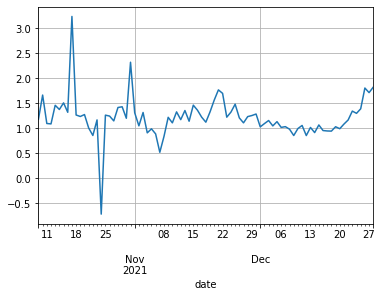

In [180]:
(dlp*7+1).plot(grid=True)

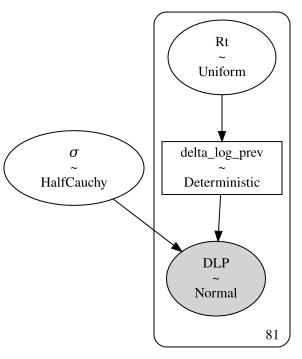

In [181]:
pm.model_graph.model_to_graphviz(rtlogI)

In [184]:
with rtlogI:
    tracert = pm.sample(2000,tune=1500,
                         init='auto', 
                         target_accept=0.8,
                         return_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Rt, 𝜎]


Sampling 4 chains for 1_500 tune and 2_000 draw iterations (6_000 + 8_000 draws total) took 12 seconds.


In [174]:
tracert

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

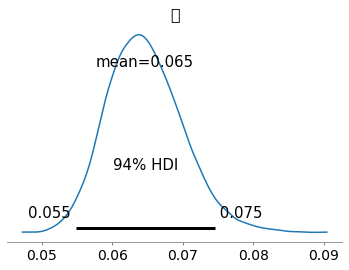

In [185]:
az.plot_posterior(tracert, var_names=[ '𝜎']);

In [186]:
inc_post = pd.DataFrame(index=dlp.index, 
                         data={'median': np.exp(tracert.posterior.delta_log_prev.median(axis=(0,1))),
           'lower': np.exp(np.percentile(tracert.posterior.delta_log_prev, 2.5, axis=(0,1))),
           'upper': np.exp(np.percentile(tracert.posterior.delta_log_prev,97.5, axis=(0,1))),
          })
fig = px.line(inc_post, render_mode="SVG")
fig.add_scatter(x=dlp.index, y=inc_post.lower, mode='none', fill='tonexty', name="95% CI")
# fig.add_scatter(x=prev.index, y=prev.values, name='Test positivity', mode='markers')
fig.update_layout(title="Prevalence estimates from the SIR model", yaxis_title="I(t)")
# fig.write_image('SIR_bayes.png', scale=3)
fig.show()

In [187]:
lrt_post = pd.DataFrame(index=dlp.index, 
                         data={'median': tracert.posterior.Rt.median(axis=(0,1)),
           'lower': np.percentile(tracert.posterior.Rt, 2.5, axis=(0,1)),
           'upper': np.percentile(tracert.posterior.Rt,97.5, axis=(0,1)),
          })
fig = px.line(lrt_post, render_mode="SVG")
fig.add_scatter(x=dlp.index, y=lrt_post.lower, mode='none', fill='tonexty', name="95% CI")
fig.add_scatter(x=rtge.index, y=rtge.values, name='FOPH Re', mode='markers')
fig.update_layout(title="$SIR-based\, R_e$", yaxis_title="$SIR-based\, R_e$")
# fig.write_image('Re_plus.png', scale=3)
fig.show()

## Forecasting

We applied Machine-learning approaches to Forecasting, namely KNN and LightGBM. 

### Lightgbm model

In [97]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from datetime import datetime, timedelta
import itertools
import matplotlib.dates as mdates
import plotly.graph_objects as go 
fmt = mdates.DateFormatter('%d-%b\n%Y')  

In [98]:
def compute_clusters(curve, t, plot = True):
    '''
    Function to compute the clusters 
    
    param curve: string. Represent the curve that will used to cluster the regions.
    
    param t: float. Represent the value used to compute the distance between the cluster and so 
    decide the number of clusters 
    
    return: array. 
    -> cluster: is the array with the computed clusters
    -> all_regions: is the array with all the regions
    '''
    context_url = "https://www.covid19.admin.ch/api/data/context"
    context = requests.get(context_url).json()
    
    df = pd.read_csv(context['sources']['individual']['csv']['daily'][curve])
    
    inc_canton = df.pivot(columns='geoRegion', values='entries')
    
    # Computing the correlation matrix based on the maximum correlation lag 
    
    del inc_canton['CHFL']
    
    del inc_canton['CH']
    
    cm,lm=lag_ccf(inc_canton.values)
    
    # Plotting the dendrogram
    linkage = hcluster.linkage(cm, method='complete')
   
    if plot == True:
        fig, ax = plt.subplots(1,1, figsize=(15,10), dpi = 100)
        hcluster.dendrogram(linkage, labels=inc_canton.columns, color_threshold=0.3, ax=ax)
        plt.show()
    
    # computing the cluster 
    
    ind = hcluster.fcluster(linkage, t, 'distance')

    grouped = pd.DataFrame(list(zip(ind,inc_canton.columns))).groupby(0) # preciso entender melhor essa linha do código 
    clusters = [group[1][1].values for group in grouped]
    
    all_regions = df.geoRegion.unique() 
    
    return clusters, all_regions

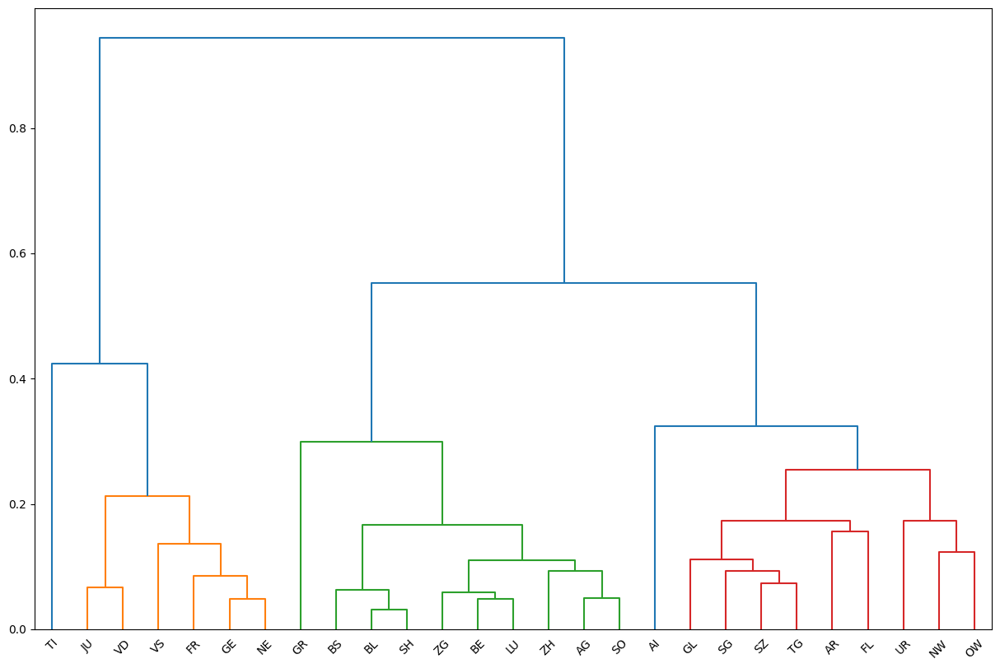

([array(['FR', 'GE', 'JU', 'NE', 'TI', 'VD', 'VS'], dtype=object),
  array(['AG', 'AI', 'AR', 'BE', 'BL', 'BS', 'FL', 'GL', 'GR', 'LU', 'NW',
         'OW', 'SG', 'SH', 'SO', 'SZ', 'TG', 'UR', 'ZG', 'ZH'], dtype=object)],
 array(['CH', 'CHFL', 'AG', 'AI', 'AR', 'BE', 'BL', 'BS', 'FL', 'FR', 'GE',
        'GL', 'GR', 'JU', 'LU', 'NE', 'NW', 'OW', 'SG', 'SH', 'SO', 'SZ',
        'TG', 'TI', 'UR', 'VD', 'VS', 'ZG', 'ZH'], dtype=object))

In [99]:
compute_clusters('cases',t=0.6)

In [100]:
def build_lagged_features(dt, maxlag=2, dropna=True):
    '''
    Builds a new DataFrame to facilitate regressing over all possible lagged features
    :param dt: Dataframe containing features
    :param maxlag: maximum lags to compute
    :param dropna: if true the initial rows containing NANs due to lagging will be dropped
    :return: Dataframe
    '''
    if type(dt) is pd.DataFrame:
        new_dict = {}
        for col_name in dt:
            new_dict[col_name] = dt[col_name]
            # create lagged Series
            for l in range(1, maxlag + 1):
                new_dict['%s_lag%d' % (col_name, l)] = dt[col_name].shift(l)
        res = pd.DataFrame(new_dict, index=dt.index)

    elif type(dt) is pd.Series:
        the_range = range(maxlag + 1)
        res = pd.concat([dt.shift(i) for i in the_range], axis=1)
        res.columns = ['lag_%d' % i for i in the_range]
    else:
        print('Only works for DataFrame or Series')
        return None
    if dropna:
        return res.dropna()
    else:
        return res

In [101]:
def lgbm_model(alpha = 0.5, params=None, **kwargs):
    '''
    Return an LGBM model
    :param kwargs:
    :return: LGBMRegressor model
    '''
    if params is None:
        params = {
            'n_jobs': 8,
            'max_depth': 4,
            'max_bin': 63,
            'num_leaves': 255,
#             'min_data_in_leaf': 1,
            'subsample': 0.9,
            'n_estimators': 200,
            'learning_rate': 0.1,
            'colsample_bytree': 0.9,
            'boosting_type': 'gbdt'
        }

    model = lgb.LGBMRegressor(objective='quantile', alpha = alpha, **params)

    return model 

In [102]:
def rolling_predictions(target_name, data,hosp_as_predict, ini_date = '2020-03-01',split = 0.25, horizon_forecast = 14, maxlag=14):
    '''Train multiple models. One for each prediction delta
    :param df_train: training dataframe 
    :param horizon_forecast: Horizon (maximum forecast range)
    :param maxlag: number of past days to consider
    :param neighbours: knn parameter
    :return: Prediction'''
    
    target = data[target_name]
    
    if hosp_as_predict == False: 
        
        for i in data.columns:
            
            if i.startswith('hosp') == True:
                data = data.drop(i, axis = 1)
        
    df_lag = build_lagged_features(copy.deepcopy(data), maxlag=maxlag )
    
    #print(type(df_lag.index[0]))
    #print(target.index[0])
    
    ini_date = max(df_lag.index[0],target.index[0], datetime.strptime(ini_date, "%Y-%m-%d"))
    
    df_lag = df_lag[ini_date:]
    target = target[ini_date:]
    df_lag = df_lag.dropna()
        

    
    # remove the target column and columns related with the day that we want to predict 
    df_lag = df_lag.drop(data.columns, axis = 1)

    
    # targets 
    targets = {}

    for T in np.arange(1,horizon_forecast+1,1):
        if T == 1:
            targets[T] = target.shift(-(T - 1))
        else:
            targets[T] = target.shift(-(T - 1))[:-(T - 1)]
#         print(T, len(df_lag), len(fit_target))
#         print(df_lag.index,fit_target.index)

    
        
    X_train, X_test, y_train, y_test = train_test_split(df_lag, target, train_size=split, test_size=1 - split, shuffle=False)
        
    
    # predictions 
    preds5 = np.empty((len(df_lag), horizon_forecast))
    preds50 = np.empty((len(df_lag), horizon_forecast))
    preds95 = np.empty((len(df_lag), horizon_forecast))
    
    forecasts5 = []
    forecasts50 = []
    forecasts95 = []
    
    for T in range(1, horizon_forecast + 1):
        
        tgt = targets[T][:len(X_train)]
        
        #tgtt = targets[T][len(X_train)]
        model5 = lgbm_model(alpha = 0.025)
        model50 = lgbm_model(alpha = 0.5)
        model95 = lgbm_model(alpha = 0.975)
        
        model5.fit(X_train, tgt)
        model50.fit(X_train, tgt)
        model95.fit(X_train, tgt)
        
        #dump(model, f'saved_models/{estimator}_{target_name}_{T}.joblib')
        
        pred5 = model5.predict(df_lag.iloc[:len(targets[T])])
        pred50 = model50.predict(df_lag.iloc[:len(targets[T])])
        pred95 = model95.predict(df_lag.iloc[:len(targets[T])])

        dif = len(df_lag) - len(pred5)
        if dif > 0:
            pred5 = list(pred5) + ([np.nan] * dif)
            
        dif = len(df_lag) - len(pred50)
        if dif > 0:
            pred50 = list(pred50) + ([np.nan] * dif)
            
        dif = len(df_lag) - len(pred95)
        if dif > 0:
            pred95 = list(pred95) + ([np.nan] * dif)
        
        preds5[:, (T - 1)] = pred5
        preds50[:, (T - 1)] = pred50
        preds95[:, (T - 1)] = pred95
        
        forecast5 = model5.predict(df_lag.iloc[-1:])
        forecast50 = model50.predict(df_lag.iloc[-1:])
        forecast95 = model95.predict(df_lag.iloc[-1:])
        
        forecasts5.append(forecast5)
        forecasts50.append(forecast50)
        forecasts95.append(forecast95)
               
        
    # transformando preds em um array
    train_size = len(X_train)
    point = targets[1].index[train_size]

    pred_window = preds5.shape[1]
    llist = range(len(targets[1].index) - (preds5.shape[1]))

    y5 = []
    y50 = []
    y95 = []
    
    x=[]
    for n in llist:
        x.append(targets[1].index[n + pred_window])
        y5.append(preds5[n][-1])
        y50.append(preds50[n][-1])
        y95.append(preds95[n][-1])
        
    forecast_dates = []

    last_day = datetime.strftime(np.array(x)[-1], '%Y-%m-%d')

    a = datetime.strptime(last_day, '%Y-%m-%d')
    
    for i in np.arange(1, horizon_forecast + 1):

        d_i = datetime.strftime(a+timedelta(days=int(i)),'%Y-%m-%d' ) 

        forecast_dates.append(datetime.strptime(d_i, '%Y-%m-%d'))

    return (np.array(x), np.array(y5),np.array(y50), np.array(y95),  targets[1], 
            len(X_train), forecast_dates, np.array(forecasts5)[:,0], np.array(forecasts50)[:,0],
            np.array(forecasts95)[:,0])

In [103]:
def plot_predictions(target_curve_name, canton, target, train_size, x, y5,y50, y95, forecast_dates, forecasts5, forecasts50,forecasts95, title, path):
    ''''
    Function to plot the predictions
    '''
    
    point = target.index[train_size]
    min_val = min([min(target), np.nanmin(y50)])
    max_val = max([max(target), np.nanmax(y50)])

    point_date = np.where(target.index == '2021-01-01')

    fig = go.Figure()
    
    # Dict with names for the curves 
    names = {'hosp': 'Hospitalization', 'ICU_patients': 'ICU patients'}
    
    if title == None: 
        
        title = f"{names[target_curve_name]} - {canton}"

    fig.update_layout(width=900, height=500, title={
            'text': title,
            'y':0.87,
            'x':0.42,
            'xanchor': 'center',
            'yanchor': 'top'},
    xaxis_title='Date',
    yaxis_title=f'{names[target_curve_name]}',
    template = 'plotly_white')

    # adicionando os traços 

    # Data
    fig.add_trace(go.Scatter(x = target.index, y = target.values, name = 'Data',line=dict(color = 'black')))
    
    #fig.add_trace(go.Scatter(x = get_real_data('2021-12-09').index, y = get_real_data('2021-12-09').ID.values, name = 'Updated Data',line=dict(color = 'green')))

    #print(get_real_data(target.index[0]).index)
    # separação entre os dados de treino e de teste
    fig.add_trace(go.Scatter(x=[point, point], y=[min_val,max_val], name="Out of sample predictions", mode = 'lines',line=dict(color = '#1CA71C', dash = 'dash')))

    # Separação entre os dados de teste e o forecast
    fig.add_trace(go.Scatter(x=[target.index[-1], target.index[-1]], y=[min_val,max_val], name="Forecast", mode = 'lines',line=dict(color = '#FB0D0D', dash = 'dash')))

    # KNN
    # LightGBM
    fig.add_trace(go.Scatter(x = x, y = y50, name = 'LightGBM',line=dict(color = '#FF7F0E')))
    
    fig.add_trace(go.Scatter(x = x, y = y5, line=dict(color = '#FF7F0E',width=0), showlegend=False))
    
    fig.add_trace(go.Scatter(x = x, y = y95,line=dict(color = '#FF7F0E', width=0),
        mode='lines',
        fillcolor='rgba(255, 127, 14, 0.3)', fill = 'tonexty', showlegend= False))

    
    fig.add_trace(go.Scatter(x = forecast_dates, y = forecasts50, name = 'Forecast LightGBM', line=dict(color = 'rgb(230, 57, 18)')))
    
    fig.add_trace(go.Scatter(x = forecast_dates, y = forecasts5, mode = 'lines', line=dict(color = 'rgb(230, 57, 18)', width =0), showlegend = False))
    
    fig.add_trace(go.Scatter(x = forecast_dates, y = forecasts95,line=dict(color = 'rgb(230, 57, 18)', width=0),
        mode='lines',
        fillcolor='rgba(230, 57, 18, 0.3)', fill = 'tonexty', showlegend = False))
    
    
    fig.update_xaxes( showgrid=True, gridwidth=1, gridcolor='lightgray',zeroline = False,
    showline=True, linewidth=1, linecolor='black', mirror = True)

    fig.update_yaxes( showgrid=True, gridwidth=1, gridcolor='lightgray', zeroline = False,
    showline=True, linewidth=1, linecolor='black', mirror = True)

    if path == None: 
        path = f"images/hosp_{canton}.png"
    fig.write_image(path)
    #pio.write_image(fig, "images/hosp_GE.png", width=900*300, height=500*300, scale=1)

    fig.show()
    
    

In [104]:
import shap
shap.initjs()

In [105]:
def make_single_prediction(target_curve_name, canton, predictors, vaccine = True, 
                           smooth= True, hosp_as_predict = False,ini_date = '2020-03-01', 
                           title = None, path = None):
    
    '''
    Function to make single prediction 
    
    Important: 
    * By default the function is using the clustering cantons and the data since 2020
    * For the predictor hospCapacity is used as predictor the column ICU_Covid19Patients
    
    params canton: canton of interest 
    params predictors: variables that  will be used in model 
    params vaccine: It determines if the vaccine data from owid will be used or not 
    params smooth: It determines if data will be smoothed or not 
    params hosp_as_predict: It determines if hosp cruves will be use as predictors or not 
    params ini_date: Determines the beggining of the train dataset
    params title: If none the title will be: Hospitalizations - canton
    params path: If none the plot will be save in the directory: images/hosp_{canton}
    '''
    
    # compute the clusters 
    clusters, all_regions = compute_clusters('hosp', t=0.8, plot = False)
    
    for cluster in clusters:
    
        if canton in cluster:

            cluster_canton = cluster
            
    
    # getting the data 
    df = get_combined_data(predictors, cluster_canton, vaccine=vaccine, smooth = smooth)
    # filling the nan values with 0
    df = df.fillna(0)
    
    # atualizando a coluna das Hospitalizações com os dados mais atualizados
    df_new = get_updated_data(smooth=smooth)
    
    df.loc[df_new.index[0]: df_new.index[-1], 'hosp_GE'] = df_new
    
    # utilizando como último data a data dos dados atualizados:
    df = df.loc[:df_new.index[-1]]
   
    # apply the model 
    
    target_name = f'{target_curve_name}_{canton}'

    horizon = 14
    maxlag = 14
    
    # get predictions and forecast 
    #date_predsknn, predsknn, targetknn, train_size, date_forecastknn, forecastknn = rolling_predictions(model_knn, 'knn', target_name, df , ini_date = '2021-01-01',split = 0.75,   horizon_forecast = horizon, maxlag=maxlag,)
    x, y5,y50, y95,  target,train_size, forecast_dates, forecasts5, forecasts50,forecasts95 = rolling_predictions(target_name, df , hosp_as_predict,  ini_date = ini_date,split = 0.75,   horizon_forecast = horizon, maxlag=maxlag)
    
    plot_predictions(target_curve_name, canton, target, train_size, x, y5,y50, y95, forecast_dates, forecasts5, forecasts50,forecasts95, title, path)
        
            
    

In [106]:
make_single_prediction('hosp', 'GE', ['cases', 'hosp', 'testPcrAntigen'], vaccine = True, smooth= True, hosp_as_predict = True, ini_date='2020-03-01')

In [ ]:
make_single_prediction('ICU_patients','GE', ['cases', 'hosp', 'test', 'testPcrAntigen', 'hospCapacity'], vaccine = True, smooth= True, hosp_as_predict = True, ini_date = '2020-03-01')

In [ ]:
make_single_prediction('hosp','GE', ['cases', 'hosp', 'testPcrAntigen'], vaccine = True, smooth= True, hosp_as_predict = False, ini_date = '2020-03-01')

In [ ]:
make_single_prediction('ICU_patients','GE', ['cases', 'hosp', 'hospCapacity',  'test'], vaccine = True, smooth= True, hosp_as_predict = False, ini_date = '2020-03-01')

In [ ]:
make_single_prediction('hosp','GE', ['cases', 'hosp', 'hospCapacity', 'test',  'testPcrAntigen'], vaccine = True, smooth= True, hosp_as_predict = False, ini_date = '2020-03-01')

In [107]:
def rolling_forecast(target_name, data, hosp_as_predict, ini_date, horizon_forecast = 14, maxlag=14):
    '''Train multiple models. One for each prediction delta
    :param target_name: name of the target variable 
    :param hosp_as_predict: Use Hospitalization series as predictor
    :param ini_date: Date to start training from
    :param horizon_forecast: Horizon (maximum forecast range)
    :param maxlag: number of past days to consider
    :return: Prediction'''
    
    target = data[target_name]
    
    if hosp_as_predict == False: 
        
        for i in data.columns:
            
            if i.startswith('hosp') == True:
                data = data.drop(i, axis = 1)
                
    df_lag = build_lagged_features(copy.deepcopy(data), maxlag=maxlag )
    
    ini_date = max(df_lag.index[0],target.index[0], datetime.strptime(ini_date, "%Y-%m-%d"))
    
    df_lag = df_lag[ini_date:]
    target = target[ini_date:]
    df_lag = df_lag.dropna()
    
    
    # remove the target column and columns related with the day that we want to predict 
    df_lag = df_lag.drop(data.columns, axis = 1)

    
    # targets 
    targets = {}

    for T in np.arange(1,horizon_forecast+1,1):
        if T == 1:
            targets[T] = target.shift(-(T - 1))
        else:
            targets[T] = target.shift(-(T - 1))[:-(T - 1)]
#         print(T, len(df_lag), len(fit_target))
#         print(df_lag.index,fit_target.index)
    
    
    # forecast
    forecasts5 = []
    forecasts50 = []
    forecasts95 = []
    models = []
    for T in range(1, horizon_forecast + 1):
        # training of the model with all the data available
        
        model5 = lgbm_model(alpha = 0.05)
        model50 = lgbm_model(alpha = 0.5)
        model95 = lgbm_model(alpha = 0.95)
        
        X = df_lag.iloc[:len(targets[T])]
        
        model5.fit(X, targets[T])
        model50.fit(X, targets[T])
        model95.fit(X, targets[T])
        models.append((model50,X))
        
        # make the forecast 
        forecast5 = model5.predict(df_lag.iloc[-1:])
        forecast50 = model50.predict(df_lag.iloc[-1:])
        forecast95 = model95.predict(df_lag.iloc[-1:])
        
        
        forecasts5.append(forecast5)
        forecasts50.append(forecast50)
        forecasts95.append(forecast95)
               
        
    # transformando preds em um array
        
    forecast_dates = []

    last_day = datetime.strftime((df_lag.index)[-1], '%Y-%m-%d')

    a = datetime.strptime(last_day, '%Y-%m-%d')
    
    for i in np.arange(1, horizon_forecast + 1):

        d_i = datetime.strftime(a+timedelta(days=int(i)),'%Y-%m-%d' ) 

        forecast_dates.append(datetime.strptime(d_i, '%Y-%m-%d'))

    return targets[1], forecast_dates, np.array(forecasts5)[:,0], np.array(forecasts50)[:,0], np.array(forecasts95)[:,0], models

In [108]:
def plot_forecast(target_curve_name, canton, ydata, dates_forecast, forecast5, forecast50, forecast95, title= None, path=None):
    ''''
    Function to plot the forecast 
    '''
    
    fig = go.Figure()

    # Dict with names for the curves 
    names = {'hosp': 'Hospitalizations', 'ICU_patients': 'ICU patients'}
    
    if title is None: 
        
        title = f"Forecast {names[target_curve_name]} - {canton}"

    fig.update_layout(width=900, height=500, title={
            'text': title,
            'y':0.87,
            'x':0.42,
            'xanchor': 'center',
            'yanchor': 'top'},
    xaxis_title='Date',
    yaxis_title=f'{names[target_curve_name]}',
    template = 'plotly_white')

    # adicionando os traços 

    # Data
    fig.add_trace(go.Scatter(x = ydata.index[-150:], y = ydata.values[-150:], name = 'Data',line=dict(color = 'black')))

    # Separation between data and forecast 
    fig.add_trace(go.Scatter(x=[ydata.index[-1], ydata.index[-1]], y=[min( min(ydata.values[-150:]), min(forecast95)),max(max(ydata.values[-150:]), max(forecast95))], name="Data/Forecast", mode = 'lines',line=dict(color = '#FB0D0D', dash = 'dash')))

    # LightGBM
    fig.add_trace(go.Scatter(x = dates_forecast, y = forecast50, name = 'Forecast LightGBM',line=dict(color = '#FF7F0E')))
    
    fig.add_trace(go.Scatter(x = dates_forecast, y = forecast5, line=dict(color = '#FF7F0E',width=0),mode = 'lines',  showlegend=False))
    
    fig.add_trace(go.Scatter(x = dates_forecast, y =forecast95,line=dict(color = '#FF7F0E', width=0),
        mode='lines',
        fillcolor='rgba(255, 127, 14, 0.3)', fill = 'tonexty', showlegend= False))

    
    
    fig.update_xaxes( showgrid=True, gridwidth=1, gridcolor='lightgray',zeroline = False,
        showline=True, linewidth=1, linecolor='black', mirror = True)

    fig.update_yaxes( showgrid=True, gridwidth=1, gridcolor='lightgray', zeroline = False,
        showline=True, linewidth=1, linecolor='black', mirror = True)

    if path == None: 
        path = f"images/forecast_{target_curve_name}_{canton}.png"
        
    fig.write_image(path)
       
    fig.show()
    


In [109]:
def save_forecasts(f5,f50,f95, dates, target):
    df = pd.DataFrame(index=dates, data={'5':f5, '50':f50, '95':f95})
    df.index.name = 'date'
    df.to_csv(f"{target}_forecast.csv")
#     np.savetxt(f'{target}_f5.csv',f5)
#     np.savetxt(f'{target}_f50.csv',f50)
#     np.savetxt(f'{target}_f95.csv',f95)

def make_forecast(target_curve_name, canton, predictors, vaccine = True, 
                  smooth= True, hosp_as_predict = False,ini_date = '2020-03-01', 
                  horizon=14,maxlag=14, title = None, path = None):
    
    # compute the clusters 
    clusters, all_regions = compute_clusters('hosp', t=0.8, plot = False)
    
    for cluster in clusters:
    
        if canton in cluster:

            cluster_canton = cluster
            
    
    # getting the data 
    df = get_combined_data(predictors, cluster_canton, vaccine=vaccine, smooth = smooth)
    # filling the nan values with 0
    df = df.fillna(0)
    
    # atualizando a coluna das Hospitalizações com os dados mais atualizados
    df_new = get_updated_data('Data_COV_w51_clean.csv')
#     print(df.columns)

#     print(df_new.tail())
    
    df.loc[df_new.index[0]: df_new.index[-1], 'hosp_GE'] = df_new
    
    # utilizando como último data a data dos dados atualizados:
    df = df.loc[:df_new.index[-1]]
   

    # apply the model 
    
    target_name = f'{target_curve_name}_{canton}'

    
    # get predictions and forecast 
    #date_predsknn, predsknn, targetknn, train_size, date_forecastknn, forecastknn = rolling_predictions(model_knn, 'knn', target_name, df , ini_date = '2021-01-01',split = 0.75,   horizon_forecast = horizon, maxlag=maxlag,)
    ydata, dates_forecast, forecast5, forecast50, forecast95, models = rolling_forecast(target_name, df, hosp_as_predict = hosp_as_predict, ini_date = ini_date, horizon_forecast=horizon, maxlag=maxlag)
    
    save_forecasts(forecast5,forecast50, forecast95, dates_forecast, target_curve_name)
    plot_forecast(target_curve_name, canton, ydata, dates_forecast, forecast5, forecast50, forecast95)
    return models

In [110]:
m50_hosp = make_forecast(target_curve_name='hosp',canton= 'GE', predictors = ['cases', 'hosp', 'test', 'testPcrAntigen', 'hospCapacity'], vaccine = False, smooth= True, hosp_as_predict = True,ini_date = '2020-03-01', maxlag=14, horizon=14, title = None, path = None)

In [111]:
m50_ICU = make_forecast(target_curve_name='ICU_patients',canton= 'GE', predictors = ['cases', 'hosp', 'test', 'testPcrAntigen', 'hospCapacity'], vaccine = True, smooth= True, hosp_as_predict = True,ini_date = '2020-03-01', title = None, path = None)

In [110]:
len(m50_hosp)

14

### Shap analysis

In [166]:
from ipywidgets import interact
import ipywidgets as widgets

In [182]:
mw = widgets.IntSlider(min=0, max=13, step=1, value=13)
samp = widgets.IntSlider(min=0,max=30,step=1,value=0)
@interact
def plot_waterfall(model=mw, ind=samp):
    models=m50_hosp
    pred = models[model][0]
    X = models[model][1]
    explainer = shap.Explainer(pred)
    shap_values = explainer(X)
    shap.plots.waterfall(shap_values[ind])
    shap.plots.beeswarm(shap_values, max_display=14)
    shap.plots.scatter(shap_values[:,"cases_GE_lag1"], color=shap_values)
    shap.plots.bar(shap_values)#.abs.max(0))
    shap.plots.heatmap(shap_values)



interactive(children=(IntSlider(value=13, description='model', max=13), IntSlider(value=0, description='ind', …

In [275]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Tue Dec 28 2021

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.28.0

arviz     : 0.11.4
pandas    : 1.3.5
networkx  : 2.6.3
holoviews : 1.14.6
scipy     : 1.7.2
urllib3   : 1.26.7
shap      : 0.40.0
lightgbm  : 3.3.1
json      : 2.0.9
numpy     : 1.20.3
plotly    : 5.4.0
geopandas : 0.7.0
seaborn   : 0.11.2
infomap   : 1.9.0
requests  : 2.26.0
geoviews  : 1.9.2
ipywidgets: 7.6.5
matplotlib: 3.5.0
pymc3     : 3.11.4

Watermark: 2.2.0



In [600]:
X.shape

(642, 27)